# <span style='color:#0D2BA5'>Projet 4 - Anticipez les besoins en consommation de bâtiments</span>
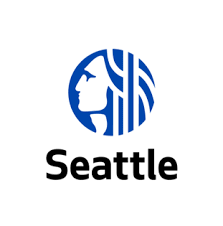

## <span style='background:#33B5FF'>Table des Matieres</span>

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

### <span style='background:#33B5FF'>1. Introduction</span>



**Mission**
*****
Vous travaillez pour la ville de Seattle. Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, votre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.




**Source**
*****
Le jeux de donnée est disponible à l'adresse : [Seatlle Data](https://s3.eu-west-1.amazonaws.com/course.oc-static.com/projects/Data_Scientist_P4/2016_Building_Energy_Benchmarking.csv)
*****



**Axes d'orientations**
*****

Nous allons :
- Réaliser une courte analyse exploratoire.
- Tester différents modèles de prédiction afin de répondre au mieux à la problématique.
- Mettre en place une évaluation rigoureuse des performances, et optimiser les hyperparamètres et le choix d’algorithmes de ML à l’aide d’une validation croisée. 
- Tester au minimum 4 algorithmes de famille différente (par exemple : ElasticNet, SVM, GradientBoosting, XGBoost, RandomForest).
- **Conclusions**

Notes : 
Les modeles linéaires et non-linéaires

Utilisations de YellowBrick 

## <span style='background:#33B5FF'>2. Bibliothèques d'analyse Python</span>

In [2]:
#Cet environnement Python 3 est livré avec de nombreuses bibliothèques d'analyse utiles installées
#Par exemple, voici plusieurs packages utiles à charger

import numpy as np # algèbre linéaire
import pandas as pd # traitement des données, E/S de fichier CSV (par exemple pd.read_csv)
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")
    


    
import matplotlib.pyplot as plt #Visualisations graphiques des données
import seaborn as sns
import matplotlib.gridspec as gridspec
%matplotlib inline
#!pip3 install plotly #installer plotly
import plotly.express as px 


import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler 
from sklearn.compose import make_column_transformer # Applique des transformateurs aux colonnes d'un tableau
from sklearn.preprocessing import OneHotEncoder #pour le recodage des variables catégorielles 
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import PowerTransformer
import matplotlib.patches as mpatches
import collections
import folium
import geopandas as gpd 
from mpl_toolkits.axes_grid1 import make_axes_locatable
from math import pi
from scipy.stats import pearsonr


from sklearn.impute import KNNImputer
from sklearn.datasets import make_regression, make_circles
from scipy.stats import kendalltau, spearmanr


from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import MinMaxScaler # pour effectuer la normalisations min-max
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split
from sklearn import decomposition, preprocessing
from sklearn import neighbors
#from missingpy import MissForest

import json
import ast



# Versions de quelques librairies 
print('Version de quelques librairies utilisées :')
print('Python        : ' + sys.version)
print('NumPy         : ' + np.version.full_version)
print('Pandas        : ' + pd.__version__)
#print('Matplotlib    : ' + plt.__version__)
print('Seaborn    : ' + sns.__version__)
#print('Plotly    : ' + px.__version__)

import datetime
now  = datetime.datetime.now().isoformat()
print('Lancé le : ' + now)

Version de quelques librairies utilisées :
Python        : 3.11.3 (main, Apr  7 2023, 19:25:52) [Clang 14.0.0 (clang-1400.0.29.202)]
NumPy         : 1.24.3
Pandas        : 2.0.1
Seaborn    : 0.12.2
Lancé le : 2023-09-23T11:20:21.641811


## <span style='background:#33B5FF'>3. Analyse du jeux de données </span>

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [4]:
#importer les données 
#chargement du fichier
dfBat = pd.read_csv('2016_Building_Energy_Benchmarking.csv',sep=',',low_memory=False)

In [5]:
#Afficher les 5 premieres lignes
dfBat.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [6]:
#Afficher le nombre de lignes et de colonnes 
lign, col = dfBat.shape
print(f'Il y a {lign} lignes et {col} colonnes')

Il y a 3376 lignes et 46 colonnes


In [7]:
#Afficher les informations sur le dataset
dfBat.info(verbose= True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [8]:
#Le type des variables
dfBat.dtypes

OSEBuildingID                        int64
DataYear                             int64
BuildingType                        object
PrimaryPropertyType                 object
PropertyName                        object
Address                             object
City                                object
State                               object
ZipCode                            float64
TaxParcelIdentificationNumber       object
CouncilDistrictCode                  int64
Neighborhood                        object
Latitude                           float64
Longitude                          float64
YearBuilt                            int64
NumberofBuildings                  float64
NumberofFloors                       int64
PropertyGFATotal                     int64
PropertyGFAParking                   int64
PropertyGFABuilding(s)               int64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
SecondLarge

In [9]:
#variables qualitatives
dfBat.describe().T

,count,mean,std,min,25%,50%,75%,max
OSEBuildingID,3376.0,2.120899e+04,1.222376e+04,1.00000,19990.750000,2.311200e+04,2.599425e+04,5.022600e+04
DataYear,3376.0,2.016000e+03,0.000000e+00,2016.00000,2016.000000,2.016000e+03,2.016000e+03,2.016000e+03
ZipCode,3360.0,9.811695e+04,1.861520e+01,98006.00000,98105.000000,9.811500e+04,9.812200e+04,9.827200e+04
CouncilDistrictCode,3376.0,4.439277e+00,2.120625e+00,1.00000,3.000000,4.000000e+00,7.000000e+00,7.000000e+00
Latitude,3376.0,4.762403e+01,4.775842e-02,47.49917,47.599860,4.761867e+01,4.765712e+01,4.773387e+01
Longitude,3376.0,-1.223348e+02,2.720329e-02,-122.41425,-122.350662,-1.223325e+02,-1.223194e+02,-1.222210e+02
YearBuilt,3376.0,1.968573e+03,3.308816e+01,1900.00000,1948.000000,1.975000e+03,1.997000e+03,2.015000e+03
NumberofBuildings,3368.0,1.106888e+00,2.108402e+00,0.00000,1.000000,1.000000e+00,1.000000e+00,1.110000e+02
NumberofFloors,3376.0,4.709123e+00,5.494465e+00,0.00000,2.000000,4.000000e+00,5.000000e+00,9.900000e+01
PropertyGFATotal,3376.0,9.483354e+04,2.188376e+05,11285.00000,28487.000000,4.417500e+04,9.099200e+04,9.320156e+06


In [10]:
#variables quantitatives
dfBat.describe(include = 'O').T

,count,unique,top,freq
BuildingType,3376,8,NonResidential,1460
PrimaryPropertyType,3376,24,Low-Rise Multifamily,987
PropertyName,3376,3362,Northgate Plaza,3
Address,3376,3354,2600 SW Barton St,4
City,3376,1,Seattle,3376
State,3376,1,WA,3376
TaxParcelIdentificationNumber,3376,3268,1625049001,8
Neighborhood,3376,19,DOWNTOWN,573
ListOfAllPropertyUseTypes,3367,466,Multifamily Housing,866
LargestPropertyUseType,3356,56,Multifamily Housing,1667


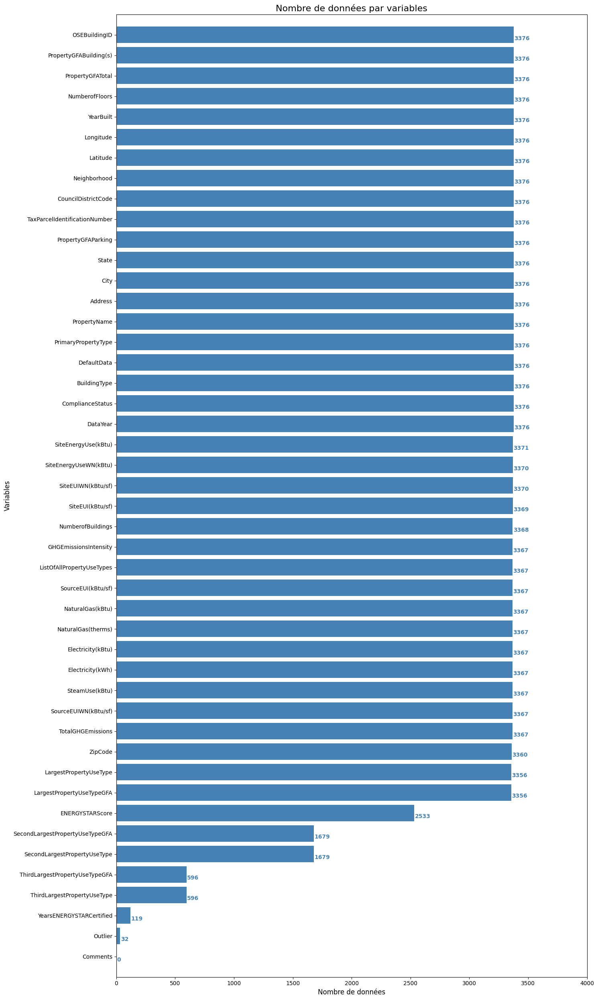

In [11]:
# Répartition des valeurs renseignées par variables
fig, ax = plt.subplots(figsize=(15, 25))

# Graphique ligne 1, colonne 1 ------------------
# Répartition des valeurs renseignées par variables
present = dfBat.count()
present.sort_values(inplace=True)
ax.barh(y=present.index, width=present.values, color='SteelBlue')
for i, v in enumerate(present):
    ax.text(v + 5, i - .25, str(v), color='SteelBlue',
            fontsize=10, fontweight='bold')
ax.set_title('Nombre de données par variables', fontsize=16)
ax.set_xlabel('Nombre de données', fontsize=12)
ax.set_ylabel('Variables', fontsize=12)
ax.tick_params(labelsize=10)
ax.set_xlim([0, 4000])
ax.set_ylim([-1, 46])
ax.grid(False)
fig.tight_layout()
plt.savefig('repartition')
plt.show()

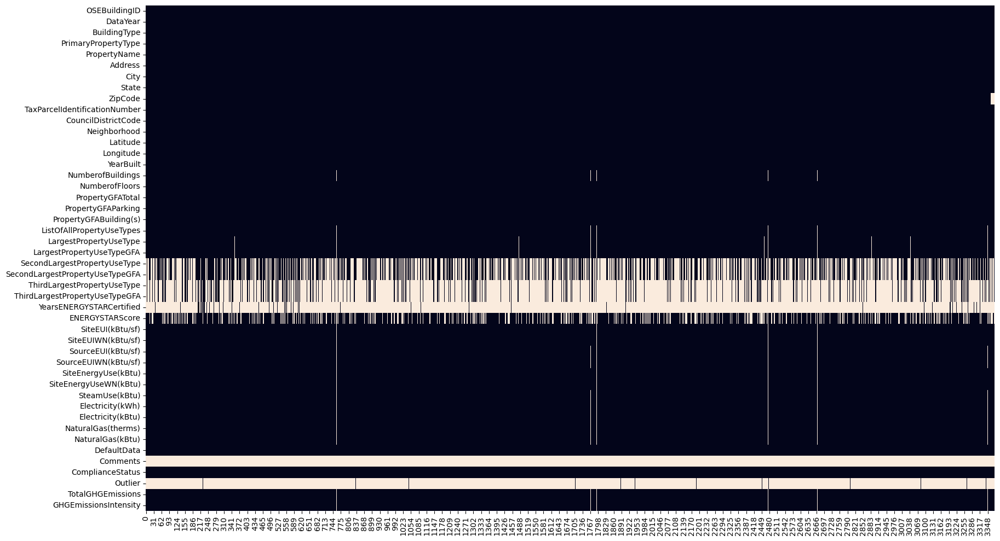

In [12]:
#Représentations des valeurs manquantes 
plt.figure(figsize=(20,12))
sns.heatmap(dfBat.isna().T, cbar= False)
plt.show()

In [13]:
#Pourcentage des valeurs manquantes
size = dfBat.shape
nan_values = dfBat.isna().sum()
nan_values = nan_values.sort_values(ascending=True)*100/size[0]
nan_values

OSEBuildingID                        0.000000
PropertyGFABuilding(s)               0.000000
PropertyGFAParking                   0.000000
PropertyGFATotal                     0.000000
NumberofFloors                       0.000000
YearBuilt                            0.000000
Longitude                            0.000000
Latitude                             0.000000
Neighborhood                         0.000000
DefaultData                          0.000000
CouncilDistrictCode                  0.000000
ComplianceStatus                     0.000000
State                                0.000000
City                                 0.000000
Address                              0.000000
PropertyName                         0.000000
PrimaryPropertyType                  0.000000
BuildingType                         0.000000
DataYear                             0.000000
TaxParcelIdentificationNumber        0.000000
SiteEnergyUse(kBtu)                  0.148104
SiteEnergyUseWN(kBtu)             

**les colonnes vides a plus de 80%**

In [14]:
# on elimine les colonnes vides a plus de 80%
dfBat = dfBat[dfBat.columns[dfBat.isna().sum()/dfBat.shape[0]<0.8]]

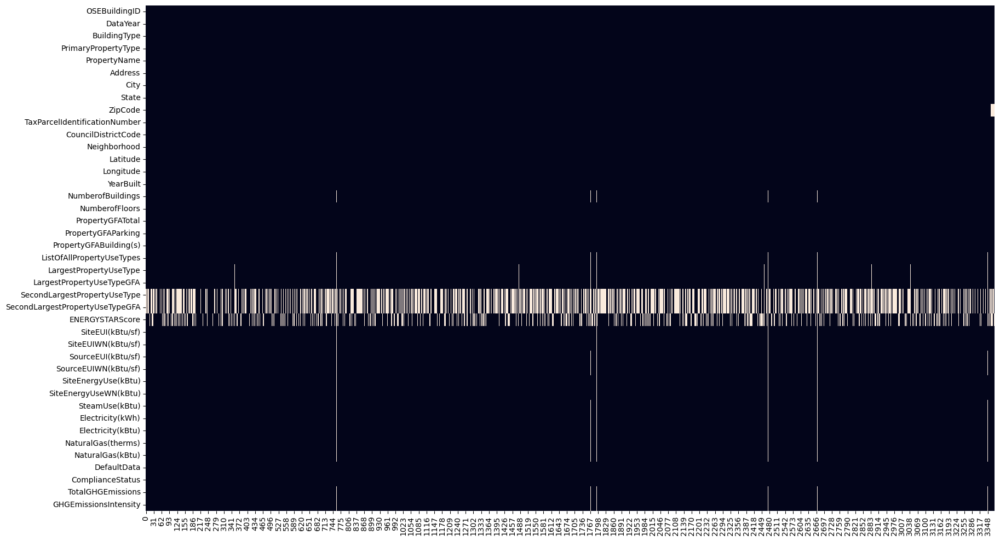

In [15]:
plt.figure(figsize=(20,12))
sns.heatmap(dfBat.isna().T, cbar= False)
plt.show()

### <span style='colour:#20185e'>3.1. Significations et variables à conserver </span>

| Variable  | Description          | Note |
| :--------------- |:---------------| -----|
| BuildingType  |   Type de bâtiment : campus, non résidentiel...        |  Filtre sur les habitations non  résidentielles |
| PrimaryPropertyType  | Utilisation principale d'une propriété (p. Ex. Bureau, magasin de détail)             |   Permet de savoir si occupation 24h/24... |
| LargestPropertyUseType  | La plus grande utilisation d'une propriété (par exemple, bureau, magasin de détail)          |     |
| SecondLargestPropertyUseType  | La deuxième plus grande utilisation d'une propriété (par exemple bureau, magasin de détail) par GFA          |     |
| CouncilDistrictCode  | La ville de Seattle est divisée en sept districts, chacun étant représenté par un membre du conseil          |    Pour représentation géographique |
| Neighborhood  | Zone de voisinage de la propriété définie par le département des quartiers de la ville de Seattle.          |    Pour représentation géographique |
| Latitude  | Latitude de propriété         |    Pour représentation géographique |
| Longitude  | Longitude de propriété        |    Pour représentation géographique |
| NumberofBuildings  | Nombre de bâtiments inclus dans le rapport de la propriété          |    Feature engineering : surface par bâtiment... |
| NumberofFloors  | Nombre d'étages         |    |
| PropertyGFABuilding(s)  | Superficie totale en pieds carrés entre les surfaces extérieures des murs d'enceinte d'un bâtiment. Cela comprend toutes les zones à l'intérieur du ou des bâtiments, telles que l'espace des locataires, les espaces communs, les cages d'escalier, les sous-sols, le stockage, etc          |     |
| ENERGYSTARScore  | Un EPA (Environmental Protection Agency) a calculé une cote de 1 à 100 qui évalue la performance énergétique globale d'une propriété, sur la base de données nationales pour contrôler les différences entre le climat, les utilisations du bâtiment et les opérations. Un score de 50 représente la médiane nationale          |     |
| SiteEnergyUseWN(kBtu)  | La quantité annuelle d'énergie consommée par la propriété à partir de toutes les sources d'énergie, ajustée à ce que la propriété aurait consommé pendant 30 ans dans des conditions météorologiques moyennes          |   **Cible n 2** |
| SteamUse(kBtu)  | La quantité annuelle de vapeur de quartier consommée par la propriété sur place, mesurée en milliers d'unités thermiques britanniques (kBtu)          |    Feature engineering? |
| Electricity(kBtu)  | La quantité annuelle d'électricité consommée par la propriété sur place, y compris l'électricité achetée au réseau et produite par des systèmes renouvelables sur place, mesurée en milliers d'unités thermiques britanniques (kBtu)          |    Pour feature engineering |
| NaturalGas(kBtu)  | La quantité annuelle de gaz naturel fourni par les services publics consommée par la propriété, mesurée en milliers d'unités thermiques britanniques (kBtu)          |    Feature engineering? |
| TotalGHGEmissions  | La quantité totale d'émissions de gaz à effet de serre, y compris le dioxyde de carbone, le méthane et les gaz d'oxyde nitreux rejetés dans l'atmosphère en raison de la consommation d'énergie de la propriété, mesurée en tonnes métriques d'équivalent dioxyde de carbone. Ce calcul utilise un facteur d'émissions de GES du portefeuille de ressources de production de Seattle CIty Light. Cela utilise le facteur d'émissions 2015 de Seattle City Light de 52,44 lb CO2e / MWh jusqu'à ce que le facteur 2016 soit disponible. Facteur de vapeur Enwave = 170,17 lb CO2e / MMBtu. Facteur gaz provenant de l'EPA Portfolio Manager = 53,11 kg CO2e / MBtu          |    **Cible n 1** |


**Suppression des variables inutiles**

In [16]:
# Suppression des variables inutiles après l'analyse de la compréhension métier
cols_a_suppr = ['PropertyName', 'TaxParcelIdentificationNumber', 'City',
                'State',
                'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
                'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
                'Electricity(kWh)', 'NaturalGas(therms)']
dfBat.drop(cols_a_suppr, axis=1, inplace=True)
# Suivi des dimensions
lign, col = dfBat.shape
print(f'Il reste {lign} lignes et {col} colonnes')

Il reste 3376 lignes et 31 colonnes


In [17]:
dfBat.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'Address', 'ZipCode', 'CouncilDistrictCode', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'DefaultData',
       'ComplianceStatus', 'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

### <span style='colour:#20185e'>3.2. Vérification des doublons</span>

**code**: identifiant unique pour chaque batiment

In [18]:
# Doublons pour la variable 'Code'
doublons_code = dfBat[dfBat.duplicated(['OSEBuildingID'], keep=False)]
nb_doublons_code = doublons_code.shape[0]
print(
    f'Nombre de doublons sur le code batiment : {int(nb_doublons_code/2)}')
doublons_code

Nombre de doublons sur le code batiment : 0


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity


**Les doublons sur le dataframe**


In [19]:
doublons = dfBat[dfBat.duplicated(keep=False)]
nb_doublons = doublons.shape[0]
print(
    f'Nombre de doublons sur le data : {int(nb_doublons/2)}')
doublons

Nombre de doublons sur le data : 0


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity


**Représentation des bâtiments sur une carte de Seattle**

In [20]:
sum = dfBat['OSEBuildingID']
# Représentation sur une carte de Seattle :
carte = folium.Map(location=[47.6488, -122.3964], zoom_start=11)
# Bâtiments construits 
for i in range(0, len(sum)):
    folium.Circle([dfBat.iloc[i]['Latitude'], dfBat.iloc[i]['Longitude']],
                  popup=dfBat.iloc[i]['Address'], radius=10, color='green',
                  fill_color='green').add_to(carte)
carte

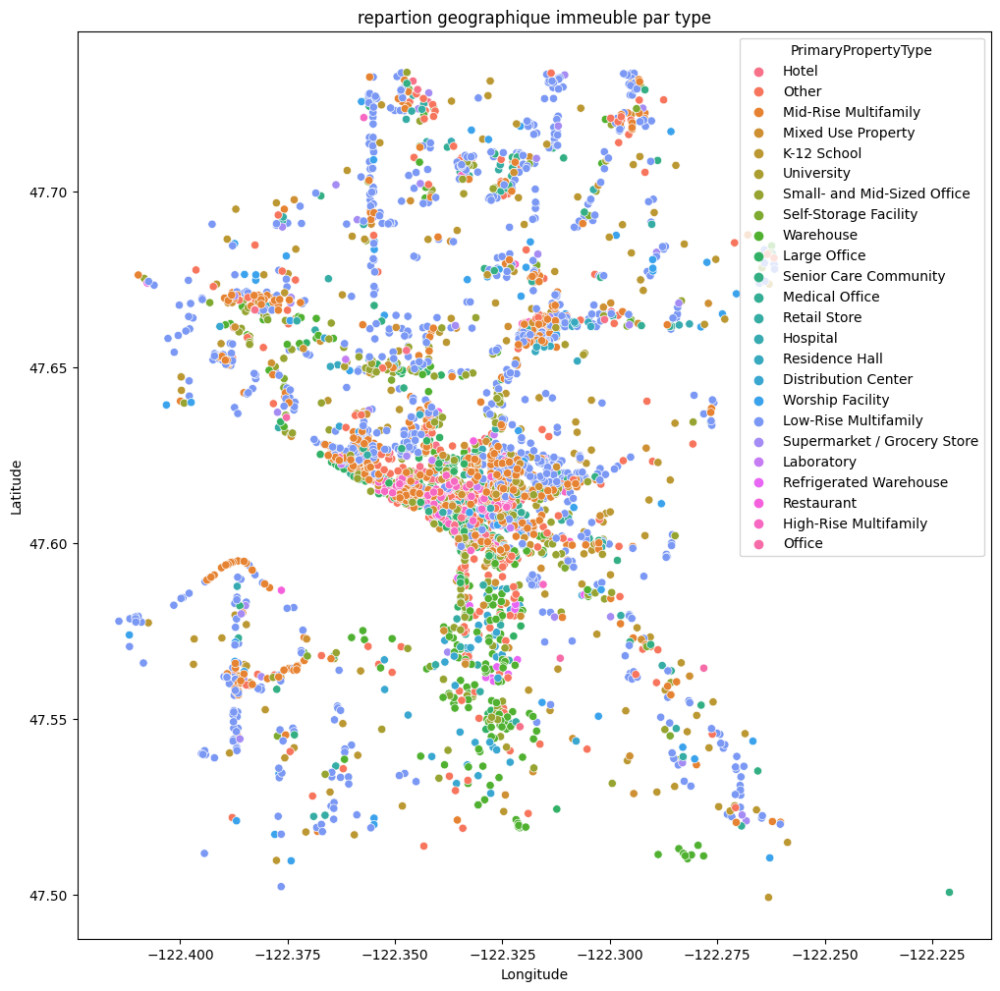

In [21]:
# affichage longitude latitude interessante pour primaryType
plt.figure(figsize=(12,12))
sns.scatterplot(x='Longitude', y='Latitude', data = dfBat, hue='PrimaryPropertyType')
plt.title('repartion geographique immeuble par type')
#plt.savefig('P4_01_11_geo_primary.jpg')
plt.show()

### <span style='colour:#20185e'>3.3. Vérification des variables et Filtre des données</span>

In [22]:
print(dfBat['DataYear'].nunique())
dfBat['DataYear'].unique().tolist()

1


[2016]

In [23]:
print(dfBat['YearBuilt'].nunique())
dfBat['YearBuilt'].unique().tolist()

113


[1927,
 1996,
 1969,
 1926,
 1980,
 1999,
 1904,
 1910,
 1998,
 1928,
 1922,
 2004,
 1930,
 1983,
 1907,
 1916,
 1985,
 1961,
 2001,
 1991,
 1955,
 1978,
 1949,
 1989,
 1906,
 1994,
 1992,
 1990,
 1950,
 1900,
 1954,
 1911,
 1973,
 1920,
 1982,
 1908,
 1959,
 2000,
 1997,
 1962,
 1970,
 2008,
 1948,
 1965,
 1929,
 2010,
 1938,
 1986,
 2002,
 1923,
 2003,
 1957,
 1964,
 1941,
 1963,
 2006,
 1915,
 1958,
 2009,
 2011,
 1971,
 2007,
 1951,
 1953,
 1952,
 1960,
 1937,
 1966,
 1968,
 1925,
 1924,
 2005,
 1909,
 1931,
 1972,
 1914,
 1913,
 1917,
 1995,
 1981,
 1976,
 1988,
 1979,
 1947,
 1984,
 1956,
 1912,
 1977,
 1921,
 1945,
 1974,
 1975,
 1946,
 1967,
 1987,
 1940,
 1932,
 1993,
 1918,
 1905,
 1902,
 1939,
 1944,
 1942,
 1903,
 2012,
 2013,
 2015,
 1901,
 1919,
 2014,
 1936,
 1935]

In [24]:
pd.DataFrame(dfBat['BuildingType'].unique(), columns=['BuildingType']).sort_values(by='BuildingType')

,BuildingType
4,Campus
6,Multifamily HR (10+)
5,Multifamily LR (1-4)
2,Multifamily MR (5-9)
0,NonResidential
1,Nonresidential COS
7,Nonresidential WA
3,SPS-District K-12


In [25]:
print(dfBat['BuildingType'].value_counts())

BuildingType
NonResidential          1460
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
Multifamily HR (10+)     110
SPS-District K-12         98
Nonresidential COS        85
Campus                    24
Nonresidential WA          1
Name: count, dtype: int64


**Note** : 
- **SPS-District K-12** : Seattle Public Schools est un district scolaire public 

In [26]:
dfBat[dfBat['BuildingType'] == 'Nonresidential WA']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
3359,50101,2016,Nonresidential WA,University,4331 Memorial Way NE,98195.0,4,NORTHEAST,47.66127,-122.31256,1962,1.0,1,68072,0,68072,College/University,College/University,68916.0,NaN,NaN,NaN,3180819.25,3180819.25,0.0,3180819.0,0.0,False,Compliant,22.17,0.33


**Filtre en conservant les bâtiments non résidentiels**

In [27]:
cols_type_bat_a_garder = ['NonResidential', 'SPS-District K-12', 'Campus','Nonresidential COS','Nonresidential WA']
dfBat = dfBat[dfBat['BuildingType'].isin(cols_type_bat_a_garder)]
# Suivi des dimensions dfBat
lign, col = dfBat.shape
print(f'Il reste {lign} lignes et {col} colonnes')

Il reste 1668 lignes et 31 colonnes


**Remarque**:
A ce stade, suite au filtre des bâtiments résidentiels, il ne reste plus que 1668 bâtiments sur les 3376 bâtiments, il va être difficile d'obtenir des performances significatives avec si peu de données.

In [28]:
pd.DataFrame({'Neighborhood' :dfBat['Neighborhood'].unique()}).sort_values(by='Neighborhood')

,Neighborhood
9,BALLARD
14,Ballard
11,CENTRAL
4,Central
13,DELRIDGE
18,DELRIDGE NEIGHBORHOODS
0,DOWNTOWN
16,Delridge
3,EAST
8,GREATER DUWAMISH


In [29]:
print(dfBat['PrimaryPropertyType'].nunique())
sorted(dfBat['PrimaryPropertyType'].unique().tolist())

22


['Distribution Center',
 'Hospital',
 'Hotel',
 'K-12 School',
 'Laboratory',
 'Large Office',
 'Low-Rise Multifamily',
 'Medical Office',
 'Mixed Use Property',
 'Office',
 'Other',
 'Refrigerated Warehouse',
 'Residence Hall',
 'Restaurant',
 'Retail Store',
 'Self-Storage Facility',
 'Senior Care Community',
 'Small- and Mid-Sized Office',
 'Supermarket / Grocery Store',
 'University',
 'Warehouse',
 'Worship Facility']

In [30]:
print(dfBat['NumberofBuildings'].nunique())
sorted(dfBat['NumberofBuildings'].unique().tolist())


16


[0.0,
 1.0,
 2.0,
 3.0,
 4.0,
 5.0,
 6.0,
 7.0,
 8.0,
 9.0,
 10.0,
 11.0,
 14.0,
 27.0,
 nan,
 23.0,
 111.0]

**Remarque**:
- 111 bâtiments, erreur? 
- 0 bâtiment, erreur? ou seulement un parking ? 
- A vérifier sur google map.

In [31]:
# Bâtiments sans bâtiments
dfBat[dfBat['NumberofBuildings'] == 0]


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
63,89,2016,NonResidential,Medical Office,1200 Harvard Ave,98122.0,3,EAST,47.612440,-122.321400,1965,0.0,3,179014,0,179014,Medical Office,Medical Office,179014.0,NaN,NaN,48.0,1.670106e+07,1.652771e+07,0.000000e+00,9886484.0,6814570.0,False,Compliant,430.84,2.41
76,113,2016,NonResidential,Small- and Mid-Sized Office,401 Mercer St,98109.0,7,MAGNOLIA / QUEEN ANNE,47.623910,-122.348370,1986,0.0,2,66240,2352,63888,"Data Center, Distribution Center, Office, Park...",Office,45900.0,Data Center,5181.0,NaN,4.166306e+06,4.192108e+06,0.000000e+00,4166305.0,0.0,False,Compliant,29.04,0.44
160,257,2016,NonResidential,Warehouse,3235 16TH AVE SW,98134.0,1,GREATER DUWAMISH,47.575070,-122.357470,1916,0.0,4,79600,0,79600,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,79600.0,NaN,NaN,34.0,2.411402e+06,2.411402e+06,0.000000e+00,2411402.0,0.0,False,Compliant,16.81,0.21
201,322,2016,NonResidential,Large Office,2801 3rd Ave,98121.0,7,DOWNTOWN,47.617570,-122.351220,1968,0.0,3,100734,26731,74003,Office,Office,100734.0,NaN,NaN,20.0,9.788717e+06,9.892566e+06,0.000000e+00,9788716.0,0.0,False,Compliant,68.24,0.68
241,366,2016,NonResidential,Small- and Mid-Sized Office,1107 NE 45th St,98105.0,4,NORTHEAST,47.661000,-122.316260,1961,0.0,5,99005,0,99005,Office,Office,79555.0,NaN,NaN,70.0,4.728488e+06,5.008124e+06,0.000000e+00,2863212.0,1865277.0,False,Compliant,119.03,1.20
264,391,2016,NonResidential,Mixed Use Property,8300 Military Rd South,98108.0,2,GREATER DUWAMISH,47.528710,-122.294430,1970,0.0,1,88400,0,88400,"Distribution Center, Non-Refrigerated Warehous...",Non-Refrigerated Warehouse,33450.0,Office,29620.0,42.0,4.383100e+06,4.811200e+06,0.000000e+00,2530658.0,1852442.0,False,Compliant,116.03,1.31
278,408,2016,NonResidential,Large Office,1424 4th Ave,98101.0,7,DOWNTOWN,47.610050,-122.336100,1926,0.0,10,132326,0,132326,"Office, Other, Retail Store",Office,92006.0,Other,12610.0,72.0,6.029020e+06,6.146692e+06,3.282471e+05,5698221.0,2551.0,False,Compliant,65.20,0.49
280,410,2016,NonResidential,Hotel,1414 4th Ave,98101.0,7,DOWNTOWN,47.609960,-122.335720,1973,0.0,19,332067,59280,272787,Hotel,Hotel,332067.0,NaN,NaN,6.0,3.778555e+07,3.798415e+07,1.558601e+07,19800542.0,2398995.0,False,Compliant,1468.50,4.42
291,421,2016,NonResidential,Other,1501 7th Ave,98101.0,7,DOWNTOWN,47.611850,-122.334210,1996,0.0,4,267335,166960,100375,"Movie Theater, Other - Restaurant/Bar, Parking",Parking,166960.0,Movie Theater,69947.0,NaN,7.273156e+06,7.378420e+06,0.000000e+00,5169902.0,2103253.0,False,Compliant,147.75,0.55
358,504,2016,Nonresidential COS,Other,4209 W Marginal Way SW,98118.0,1,DELRIDGE,47.565480,-122.353780,1955,0.0,1,113780,0,113780,"Office, Other - Services",Other - Services,91532.0,Office,22248.0,NaN,3.574542e+06,4.021869e+06,0.000000e+00,1470885.0,2103657.0,False,Compliant,121.98,1.07


Après recheche dans Google Street (dernière mise à jour), ces adresses ont bien un bâtiment ==> on transformera '0' en '1'.

In [32]:
# Correction des batiments en passant de 'O' à '1'
dfBat.loc[dfBat['NumberofBuildings'] == 0, 'NumberofBuildings'] = 1
# Vérification
dfBat[dfBat['NumberofBuildings'] == 0].shape[0]

0

In [33]:
dfBat[dfBat['NumberofBuildings'] == 111]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
3274,49967,2016,Campus,University,NE 45th St & Brooklyn Ave,98105.0,4,NORTHEAST,47.65644,-122.31041,1900,111.0,0,9320156,0,9320156,College/University,College/University,9320156.0,NaN,NaN,NaN,873923712.0,0.0,84985240.0,657074389.0,0.0,False,Compliant,11140.56,1.2


Après recherche dans Google Street, le bâtiment à cette adresse correspond à un campus universitaire qui peut contenir 111 bâtiments, donc pas une valeur aberrante.


In [34]:
print(dfBat['NumberofFloors'].nunique())
sorted(dfBat['NumberofFloors'].unique().tolist())

45


[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 27,
 28,
 29,
 30,
 33,
 34,
 36,
 37,
 39,
 41,
 42,
 46,
 47,
 49,
 55,
 56,
 63,
 76,
 99]

église sans étage ==> erreur 
Après recherche dans Google Street, ce bâtiment correspond à une église moderne avec au maximum 2 étages. C'est une erreur de saisie, on transformera 99 en 2.

In [35]:
# Correction du lieu en passant de 99 étages à 2
dfBat.loc[dfBat["NumberofFloors"] == 99, "NumberofFloors"] = 2
# Vérification
dfBat[dfBat["NumberofFloors"] == 99].shape[0]

0

In [36]:
print(dfBat['ListOfAllPropertyUseTypes'].nunique())
dfBat['ListOfAllPropertyUseTypes'].unique().tolist()

373


['Hotel',
 'Hotel, Parking, Restaurant',
 'Hotel, Parking, Swimming Pool',
 'Police Station',
 'Other - Entertainment/Public Assembly',
 'Hotel, Parking',
 'Data Center, Library, Parking',
 'Fitness Center/Health Club/Gym, Office, Swimming Pool',
 'Office, Other, Other - Lodging/Residential, Restaurant, Social/Meeting Hall',
 'Courthouse',
 'Other',
 'K-12 School',
 'College/University',
 'Automobile Dealership',
 'Hotel, Parking, Retail Store, Swimming Pool',
 'K-12 School, Multifamily Housing, Office, Other - Entertainment/Public Assembly',
 'Self-Storage Facility',
 'Energy/Power Station, Laboratory, Manufacturing/Industrial Plant, Non-Refrigerated Warehouse, Office',
 'Non-Refrigerated Warehouse, Office, Refrigerated Warehouse',
 'Non-Refrigerated Warehouse, Office',
 'Office, Other - Education',
 'Office, Self-Storage Facility, Vocational School',
 'Data Center, Office, Retail Store',
 'Other - Mall, Personal Services (Health/Beauty, Dry Cleaning, etc)',
 'Office, Retail Store',
 

In [37]:
print(dfBat['LargestPropertyUseType'].nunique())
dfBat['LargestPropertyUseType'].unique().tolist()

56


['Hotel',
 'Police Station',
 'Other - Entertainment/Public Assembly',
 'Library',
 'Fitness Center/Health Club/Gym',
 'Social/Meeting Hall',
 'Courthouse',
 'Other',
 'K-12 School',
 'College/University',
 'Automobile Dealership',
 'Office',
 'Self-Storage Facility',
 'Non-Refrigerated Warehouse',
 'Other - Mall',
 'Senior Care Community',
 'Medical Office',
 'Retail Store',
 'Hospital (General Medical & Surgical)',
 'Museum',
 'Repair Services (Vehicle, Shoe, Locksmith, etc)',
 'Other - Lodging/Residential',
 'Residence Hall/Dormitory',
 'Other/Specialty Hospital',
 'Financial Office',
 'Distribution Center',
 'Parking',
 'Multifamily Housing',
 'Worship Facility',
 'Restaurant',
 'Data Center',
 'Laboratory',
 'Supermarket/Grocery Store',
 'Convention Center',
 'Urgent Care/Clinic/Other Outpatient',
 nan,
 'Other - Services',
 'Strip Mall',
 'Wholesale Club/Supercenter',
 'Refrigerated Warehouse',
 'Manufacturing/Industrial Plant',
 'Other - Recreation',
 'Lifestyle Center',
 'Other

## <span style='background:#33B5FF'>4. Les valeurs manquantes du jeux de données </span>

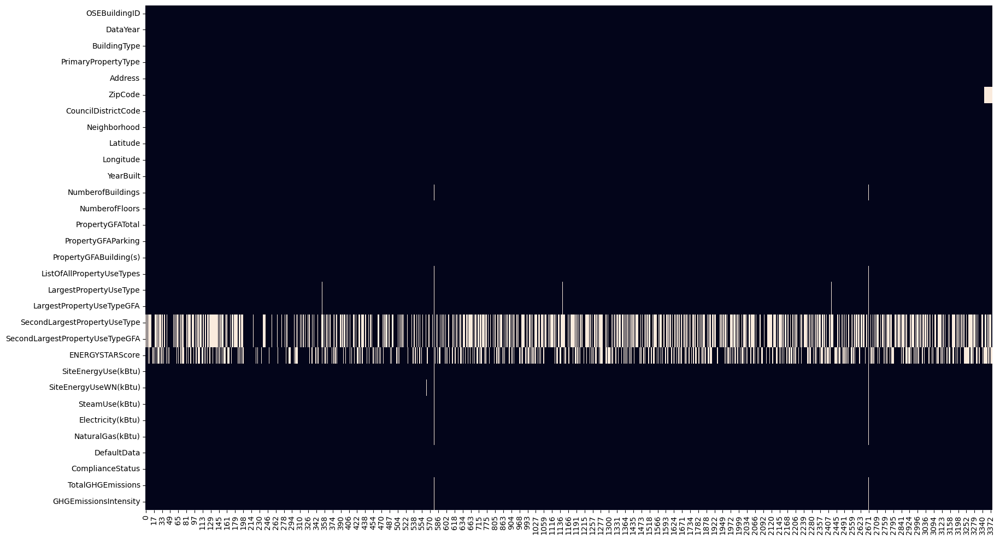

In [38]:
plt.figure(figsize=(20,12))
sns.heatmap(dfBat.isna().T, cbar= False)
plt.show()

In [39]:
dfBat_Copy = dfBat.copy()

In [40]:
dfBat_Copy.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'Address', 'ZipCode', 'CouncilDistrictCode', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'DefaultData',
       'ComplianceStatus', 'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

**Suppression des lignes pour lesquelles les variables cibles sont nulles**

In [41]:
dfBat_Copy = dfBat_Copy[~(dfBat_Copy['SiteEnergyUseWN(kBtu)'].isna()
                  | dfBat_Copy['TotalGHGEmissions'].isna())]
# Suivi des dimensions dfBat
lign, col = dfBat_Copy.shape
print(f'Il reste {lign} lignes et {col} colonnes')

Il reste 1665 lignes et 31 colonnes


**Variables 'SecondLargestPropertyUseTypeGFA' et 'LargestPropertyUseTypeGFA'**

- On considère que si ces variables ne sont pas renseignées c'est qu'il n'y a pas eu d'utilisation. On impute ces valeurs par 0.

In [42]:
dfBat_Copy['SecondLargestPropertyUseTypeGFA'] = dfBat_Copy['SecondLargestPropertyUseTypeGFA'].fillna(0)
dfBat_Copy['LargestPropertyUseTypeGFA'] = dfBat_Copy['LargestPropertyUseTypeGFA'].fillna(0)

**Variable 'ENERGYSTARScore'**

- Comme on doit observer l'impact de l'energystar score sur le modèle de l'émission en CO2, cette variable ne sera pas imputée pour le moment.


**Variables 'SecondLargestPropertyUseType'**

- On considère que si la variable est vide, c'est qu'elle ne fait pas l'objet d'une seconde utilisation : on impute par une constante 'NonUtilisée'.

In [43]:
# Imputation par constante 'NonUtilisée'
dfBat_Copy['SecondLargestPropertyUseType'] = dfBat_Copy['SecondLargestPropertyUseType'].fillna('NonUtilisée')
# Vérification
print(dfBat_Copy[dfBat_Copy['SecondLargestPropertyUseType'].isna()].shape[0])

0


**Variable 'LargestPropertyUseType'**
- on peut se baser sur la variable 'PrimaryPropertyType' pour renseigner 'LargestPropertyUseType'.

In [44]:
dfBat_Copy['PrimaryPropertyType'].unique().tolist()

['Hotel',
 'Other',
 'Mixed Use Property',
 'K-12 School',
 'University',
 'Small- and Mid-Sized Office',
 'Self-Storage Facility',
 'Warehouse',
 'Large Office',
 'Senior Care Community',
 'Medical Office',
 'Retail Store',
 'Hospital',
 'Residence Hall',
 'Distribution Center',
 'Worship Facility',
 'Supermarket / Grocery Store',
 'Laboratory',
 'Refrigerated Warehouse',
 'Restaurant',
 'Low-Rise Multifamily',
 'Office']

In [45]:
dfBat_Copy['LargestPropertyUseType'].unique().tolist()

['Hotel',
 'Police Station',
 'Other - Entertainment/Public Assembly',
 'Library',
 'Fitness Center/Health Club/Gym',
 'Social/Meeting Hall',
 'Courthouse',
 'Other',
 'K-12 School',
 'College/University',
 'Automobile Dealership',
 'Office',
 'Self-Storage Facility',
 'Non-Refrigerated Warehouse',
 'Other - Mall',
 'Senior Care Community',
 'Medical Office',
 'Retail Store',
 'Hospital (General Medical & Surgical)',
 'Museum',
 'Repair Services (Vehicle, Shoe, Locksmith, etc)',
 'Other - Lodging/Residential',
 'Residence Hall/Dormitory',
 'Other/Specialty Hospital',
 'Financial Office',
 'Distribution Center',
 'Parking',
 'Multifamily Housing',
 'Worship Facility',
 'Restaurant',
 'Data Center',
 'Laboratory',
 'Supermarket/Grocery Store',
 'Convention Center',
 'Urgent Care/Clinic/Other Outpatient',
 nan,
 'Other - Services',
 'Strip Mall',
 'Wholesale Club/Supercenter',
 'Refrigerated Warehouse',
 'Manufacturing/Industrial Plant',
 'Other - Recreation',
 'Lifestyle Center',
 'Other

In [46]:
dfBat_Copy.loc[dfBat_Copy['LargestPropertyUseType'].isna()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
353,496,2016,NonResidential,Self-Storage Facility,2811 NW Market Street,98107.0,6,BALLARD,47.66838,-122.39310,1946,2.0,2,111445,0,111445,"Fitness Center/Health Club/Gym, Office, Other ...",NaN,0.0,NonUtilisée,0.0,NaN,5.697472e+06,6.076957e+06,0.0,3007514.0,2689958.0,False,Compliant,163.83,1.47
1147,21103,2016,NonResidential,Hotel,2000 Second Avenue,98121.0,7,DOWNTOWN,47.61203,-122.34165,1910,1.0,8,61721,0,61721,Hotel,NaN,0.0,NonUtilisée,0.0,93.0,2.897080e+06,2.968430e+06,0.0,2534592.0,362488.0,False,Compliant,36.92,0.60
2414,25568,2016,NonResidential,Small- and Mid-Sized Office,1341 N Northlake Way,98103.0,4,LAKE UNION,47.64747,-122.34086,2008,1.0,4,48350,0,48350,Office,NaN,0.0,NonUtilisée,0.0,45.0,3.168131e+06,3.280956e+06,0.0,3168131.0,0.0,False,Compliant,22.09,0.46
2459,25711,2016,NonResidential,Restaurant,614 S MAYNARD AVE S,98104.0,2,DOWNTOWN,47.59697,-122.32474,1913,1.0,3,28800,0,28800,Restaurant,NaN,0.0,NonUtilisée,0.0,NaN,8.999242e+05,9.358332e+05,0.0,402907.0,497017.0,False,Compliant,29.21,1.01


In [47]:
index_a_modifier = dfBat_Copy.loc[dfBat_Copy['LargestPropertyUseType'].isna()].index.tolist()
dfBat_Copy.loc[index_a_modifier, 'LargestPropertyUseType'] = dfBat_Copy.loc[index_a_modifier, 'PrimaryPropertyType'].tolist()
# Vérification
dfBat_Copy[dfBat_Copy['LargestPropertyUseType'].isna()].shape[0]

0

**Variable ZipCode**

In [48]:
dfBat_Copy.loc[dfBat_Copy['ZipCode'].isna()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
3360,50196,2016,Nonresidential COS,Mixed Use Property,10510 5th Ave NE,NaN,5,NORTH,47.70541,-122.32232,2005,1.0,1,20616,0,20616,"Fitness Center/Health Club/Gym, Office, Other ...",Other - Recreation,9900.0,Fitness Center/Health Club/Gym,8577.0,NaN,6.369655e+05,6.369655e+05,0.0,6.369655e+05,0.000000e+00,False,Compliant,4.44,0.22
3361,50198,2016,Nonresidential COS,Other,405 MLK Jr Way S,NaN,3,CENTRAL,47.59905,-122.29787,2013,1.0,1,11685,0,11685,Prison/Incarceration,Prison/Incarceration,11685.0,NonUtilisée,0.0,NaN,8.510538e+05,9.691420e+05,0.0,3.472887e+05,5.037650e+05,False,Compliant,29.18,2.50
3362,50201,2016,Nonresidential COS,Other,8729 15th Ave NW,NaN,6,BALLARD,47.69330,-122.37717,2010,1.0,1,11968,0,11968,Prison/Incarceration,Prison/Incarceration,11968.0,NonUtilisée,0.0,NaN,7.834230e+05,8.587730e+05,0.0,4.032431e+05,3.801800e+05,False,Compliant,23.00,1.92
3363,50204,2016,Nonresidential COS,Other,2806 NE 127th St,NaN,5,NORTH,47.72126,-122.29735,1949,1.0,1,11285,0,11285,Prison/Incarceration,Prison/Incarceration,11285.0,NonUtilisée,0.0,NaN,6.456654e+05,7.059837e+05,0.0,4.317954e+05,2.138700e+05,False,Compliant,14.37,1.27
3364,50207,2016,Nonresidential COS,Other,6020 28th ave NW,NaN,6,BALLARD,47.67295,-122.39228,1911,1.0,1,16795,0,16795,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,8680.0,Fitness Center/Health Club/Gym,7014.0,NaN,9.366165e+05,9.905455e+05,0.0,5.421344e+05,3.944820e+05,False,Compliant,24.73,1.47
3365,50208,2016,Nonresidential COS,Other,1471 NW 67th St,NaN,6,BALLARD,47.67734,-122.37624,1972,1.0,1,12769,0,12769,"Fitness Center/Health Club/Gym, Office, Other ...",Other - Recreation,10912.0,Fitness Center/Health Club/Gym,1670.0,NaN,5.117308e+06,5.370264e+06,0.0,1.205173e+06,3.912135e+06,False,Compliant,216.18,16.93
3366,50210,2016,Nonresidential COS,Office,1403 w howe,NaN,7,MAGNOLIA / QUEEN ANNE,47.63572,-122.37525,1952,1.0,1,13661,0,13661,Office,Office,13661.0,NonUtilisée,0.0,75.0,5.026677e+05,5.585251e+05,0.0,5.026678e+05,0.000000e+00,True,Error - Correct Default Data,3.50,0.26
3367,50212,2016,Nonresidential COS,Other,1400 E Galer St,NaN,3,EAST,47.63228,-122.31574,1912,1.0,1,23445,0,23445,Other - Recreation,Other - Recreation,23445.0,NonUtilisée,0.0,NaN,5.976246e+06,6.716330e+06,0.0,1.260870e+06,4.715376e+06,False,Compliant,259.22,11.06
3368,50219,2016,Nonresidential COS,Mixed Use Property,2323 East Cherry St,NaN,3,CENTRAL,47.60775,-122.30225,1994,1.0,1,20050,0,20050,"Fitness Center/Health Club/Gym, Office, Other ...",Other - Recreation,8108.0,Fitness Center/Health Club/Gym,7726.0,NaN,1.813404e+06,1.993137e+06,0.0,7.694531e+05,1.043951e+06,False,Compliant,60.81,3.03
3369,50220,2016,Nonresidential COS,Office,4420 S Genesee,NaN,2,SOUTHEAST,47.56440,-122.27813,1960,1.0,1,15398,0,15398,Office,Office,15398.0,NonUtilisée,0.0,93.0,3.878100e+05,4.141724e+05,0.0,2.775369e+05,1.102730e+05,True,Error - Correct Default Data,7.79,0.51


**Remarque**: Pour eviter de perdre des données etant donné que ce sont des batiments non-résidentiels, nous allons cherché manuellement leur 'ZipCode' sur google 

In [49]:
dfBat_Copy.loc[dfBat_Copy['Address'] == '405 MLK Jr Way S','ZipCode']= 98144
dfBat_Copy.loc[dfBat_Copy['Address'] == '10510 5th Ave NE','ZipCode']= 98125
dfBat_Copy.loc[dfBat_Copy['Address'] == '8729 15th Ave NW','ZipCode']= 98117
dfBat_Copy.loc[dfBat_Copy['Address'] == '2806 NE 127th St','ZipCode']= 98125
dfBat_Copy.loc[dfBat_Copy['Address'] == '6020 28th ave NW','ZipCode']= 98107
dfBat_Copy.loc[dfBat_Copy['Address'] == '1471 NW 67th StW','ZipCode']= 98117
dfBat_Copy.loc[dfBat_Copy['Address'] == '1403 w howe','ZipCode']= 98119
dfBat_Copy.loc[dfBat_Copy['Address'] == '1400 E Galer St','ZipCode']= 98112
dfBat_Copy.loc[dfBat_Copy['Address'] == '2323 East Cherry St','ZipCode']= 98122
dfBat_Copy.loc[dfBat_Copy['Address'] == '4420 S Genesee','ZipCode']= 98118
dfBat_Copy.loc[dfBat_Copy['Address'] == '6920 34th Ave SW','ZipCode']= 98126
dfBat_Copy.loc[dfBat_Copy['Address'] == '1600 S Dakota St','ZipCode']= 98108
dfBat_Copy.loc[dfBat_Copy['Address'] == '719 8th Ave S','ZipCode']= 98104
dfBat_Copy.loc[dfBat_Copy['Address'] == '1920 1st Ave W','ZipCode']= 98119
dfBat_Copy.loc[dfBat_Copy['Address'] == '8319 8th Ave S','ZipCode']= 98108
dfBat_Copy.loc[dfBat_Copy['Address'] == '2820 S Myrtle St','ZipCode']= 98108
dfBat_Copy.loc[dfBat_Copy['Address'] == '1471 NW 67th St','ZipCode']= 98117
dfBat_Copy.loc[dfBat_Copy['ZipCode'].isna()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity


## <span style='background:#33B5FF'>5. Analyses </span>

### <span style='colour:#20185e'>5.1 Matrice de Corrélation </span>

**SiteEnergyUseWN(kBtu)** et **TotalGHGEmissions**

In [50]:
dfBat_Copy['SiteEnergyUseWN(kBtu)'].corr(dfBat_Copy['TotalGHGEmissions'])

0.8559816826908216

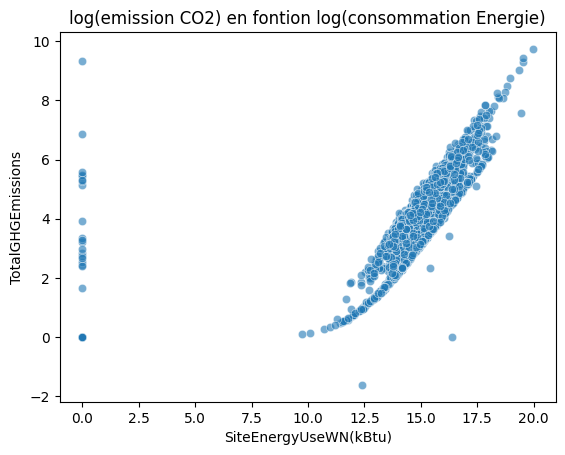

In [51]:
plt.title('log(emission CO2) en fontion log(consommation Energie)')
sns.scatterplot(x=np.log1p(dfBat_Copy['SiteEnergyUseWN(kBtu)']), y= np.log1p(dfBat_Copy['TotalGHGEmissions']), alpha= 0.6 )
plt.show()

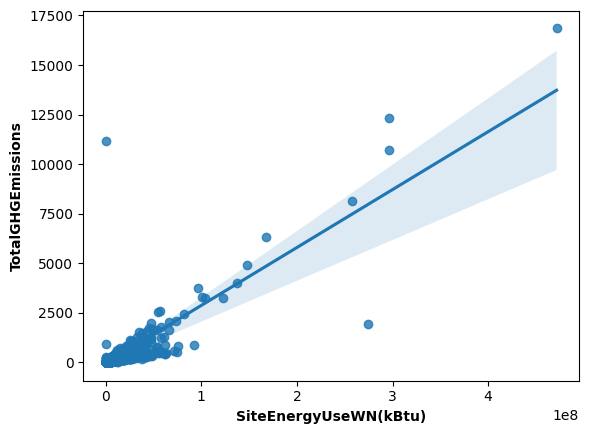

In [52]:
sns.regplot(data=dfBat_Copy, x='SiteEnergyUseWN(kBtu)', y='TotalGHGEmissions')
plt.xlabel('SiteEnergyUseWN(kBtu)', fontweight='bold')
plt.ylabel('TotalGHGEmissions', fontweight='bold')
plt.show()

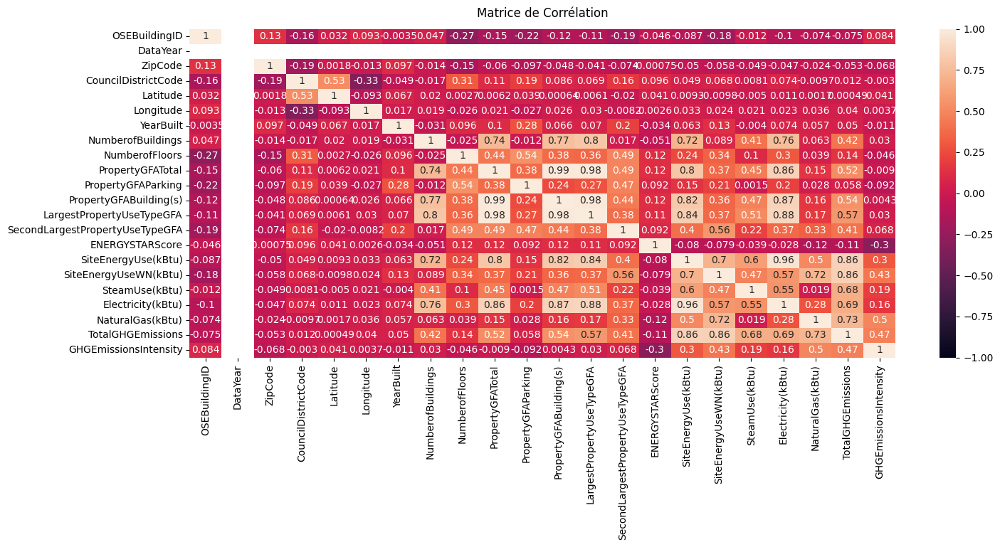

In [53]:
# Analyse  des variables quantitatives
cols_num = dfBat_Copy.select_dtypes(include=[np.number]).columns.to_list()
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(dfBat_Copy[cols_num].corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Matrice de Corrélation', fontdict={'fontsize':12}, pad=12);


**Bilan** :

Des colinéarités fortes existent entre :

- PropertyGFATotal et
    - PropertyGFABuilding(s) (0.99)
    - LargestPropertyUseTypeGFA (0.98)
- LargestPropertyUseTypeGFA et
    - PropertyGFABuilding(s) (0.98)
    - PropertyGFATotal (0.98)
- SiteEnergyUse(kBtu) et
    - TotalGHGEmissions (0.86)
    - Electricity(kBtu) (0.96)
- SiteEnergyUseWN(kBtu) et
    - TotalGHGEmissions (0.86)
    - LargestPropertyUseTypeGFA (0.88)
    - PropertyGFABuilding(s) (0.86)
    - PropertyGFATotal (0.86)



### <span style='colour:#20185e'>5.2 Test de Corrélation : **Pearson**</span>

**L'intérêt des tests de corrélation est d'apporter plus de pertinence et fiabilité aux coefficients de corrélation**

- On pose les hypothèses de départ :
    - H0 : Variables indépendantes si p-value > 5%
    - H1 : Variables non indépendantes si p-value < 5%

****SiteEnergyUseWN(kBtu)** et **TotalGHGEmissions****

**La première sortie correspond au coefficient de corrélation, la seconde à la p-value (ou probabilité critique)**

In [51]:
pearsonr(dfBat_Copy['SiteEnergyUseWN(kBtu)'], dfBat_Copy['TotalGHGEmissions'])

PearsonRResult(statistic=0.855981682690822, pvalue=0.0)

- H0 : Variables indépendantes si p-value > 5%
- H1 : Variables non indépendantes si p-value < 5%

**PropertyGFATotal et PropertyGFABuilding(s)**

In [52]:
pearsonr(dfBat_Copy['PropertyGFATotal'], dfBat_Copy['PropertyGFABuilding(s)'])

PearsonRResult(statistic=0.9904700951988488, pvalue=0.0)

Si on veut rejeter H0 et prendre H1, j'ai 0% de chance de me tromper

**Matrice des p-values**

On effectue un test de corrélation sur chaque variable 2 à 2 en isolant uniquement la p-value

In [53]:
cols_num.remove('ENERGYSTARScore')
a = np.empty((len(cols_num),len(cols_num),))
a[:] = np.nan
for i in range(0,len(cols_num)):
    for j in range(0,len(cols_num)):
        a[i,j] = pearsonr(dfBat_Copy[cols_num].iloc[:,i], dfBat_Copy[cols_num].iloc[:,j])[1]

df_pvalue = round(pd.DataFrame(a, columns=cols_num, index = cols_num),5)

In [54]:
cm = sns.light_palette("green", as_cmap=True) 

df_pvalue.style.background_gradient(cmap=cm)

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,0.000000,0.000000,0.000000,0.195680,0.000140,0.887760,0.055590,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000370,0.000000,0.635620,0.000040,0.002680,0.002330,0.000580
ZipCode,0.000000,0.000000,0.000000,0.941050,0.594260,0.000070,0.554650,0.000000,0.014820,0.000070,0.049940,0.096140,0.002630,0.041910,0.017170,0.043770,0.053700,0.318310,0.029690,0.005820
CouncilDistrictCode,0.000000,0.000000,0.000000,0.000000,0.000000,0.047840,0.482190,0.000000,0.000010,0.000000,0.000470,0.005000,0.000000,0.047060,0.005400,0.741870,0.002410,0.691920,0.611120,0.901850
Latitude,0.195680,0.941050,0.000000,0.000000,0.000140,0.006520,0.406230,0.912370,0.800610,0.109010,0.979120,0.802310,0.418350,0.704140,0.689420,0.838440,0.643960,0.944110,0.983960,0.097290
Longitude,0.000140,0.594260,0.000000,0.000140,0.000000,0.491480,0.428730,0.295170,0.382820,0.270180,0.281470,0.216580,0.736610,0.174030,0.320330,0.391810,0.349590,0.143220,0.102230,0.879410
YearBuilt,0.887760,0.000070,0.047840,0.006520,0.491480,0.000000,0.209300,0.000080,0.000030,0.000000,0.006830,0.004350,0.000000,0.010360,0.000000,0.870850,0.002510,0.019650,0.041980,0.661680
NumberofBuildings,0.055590,0.554650,0.482190,0.406230,0.428730,0.209300,0.000000,0.310360,0.000000,0.619570,0.000000,0.000000,0.497750,0.000000,0.000260,0.000000,0.000000,0.009840,0.000000,0.221900
NumberofFloors,0.000000,0.000000,0.000000,0.912370,0.295170,0.000080,0.310360,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000040,0.000000,0.109340,0.000000,0.062410
PropertyGFATotal,0.000000,0.014820,0.000010,0.800610,0.382820,0.000030,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.714690
PropertyGFAParking,0.000000,0.000070,0.000000,0.109010,0.270180,0.000000,0.619570,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.951260,0.000000,0.249820,0.017290,0.000180


Obtient-on les mêmes p-value si on centre et on réduit ?

In [55]:
from sklearn.preprocessing import StandardScaler
df_CR = StandardScaler().fit_transform(dfBat_Copy[cols_num])
df_CR = pd.DataFrame(df_CR, columns=cols_num)
df_CR.head(3)

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,-1.181993,-0.862056,1.208095,-0.079643,-0.206500,-1.067559,-0.068397,1.292494,-0.102490,-0.304528,-0.061979,-0.036468,-0.354473,-0.040125,-0.027591,0.270406,-0.091267,-0.074137,0.086388,0.522803
1,-1.181921,-0.862056,1.208095,-0.059511,-0.041382,1.040277,-0.068397,1.129661,-0.051631,0.051945,-0.061740,-0.052943,-0.071839,-0.001718,0.027219,-0.093015,-0.125079,0.338701,0.147400,0.535641
2,-1.181849,-0.862056,1.208095,-0.043738,-0.210973,0.215471,-0.068397,6.014656,2.813796,4.350599,2.297487,2.380356,-0.354473,2.121008,2.989826,3.818270,2.100456,-0.050943,2.532351,0.248924


**On fait le test de corrélation**

In [56]:
for i in range(0,len(cols_num)):
    for j in range(0,len(cols_num)):
        a[i,j] = pearsonr(df_CR.iloc[:,i], df_CR.iloc[:,j])[1]

df_CR_pvalue = round(pd.DataFrame(a, columns=cols_num, index = cols_num),5)

In [57]:
cm = sns.light_palette("green", as_cmap=True) 

df_CR_pvalue.style.background_gradient(cmap=cm)

,OSEBuildingID,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,0.000000,0.000000,0.000000,0.195680,0.000140,0.887760,0.055590,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000370,0.000000,0.635620,0.000040,0.002680,0.002330,0.000580
ZipCode,0.000000,0.000000,0.000000,0.941050,0.594260,0.000070,0.554650,0.000000,0.014820,0.000070,0.049940,0.096140,0.002630,0.041910,0.017170,0.043770,0.053700,0.318310,0.029690,0.005820
CouncilDistrictCode,0.000000,0.000000,0.000000,0.000000,0.000000,0.047840,0.482190,0.000000,0.000010,0.000000,0.000470,0.005000,0.000000,0.047060,0.005400,0.741870,0.002410,0.691920,0.611120,0.901850
Latitude,0.195680,0.941050,0.000000,0.000000,0.000140,0.006520,0.406230,0.912370,0.800610,0.109010,0.979120,0.802310,0.418350,0.704140,0.689420,0.838440,0.643960,0.944110,0.983960,0.097290
Longitude,0.000140,0.594260,0.000000,0.000140,0.000000,0.491480,0.428730,0.295170,0.382820,0.270180,0.281470,0.216580,0.736610,0.174030,0.320330,0.391810,0.349590,0.143220,0.102230,0.879410
YearBuilt,0.887760,0.000070,0.047840,0.006520,0.491480,0.000000,0.209300,0.000080,0.000030,0.000000,0.006830,0.004350,0.000000,0.010360,0.000000,0.870850,0.002510,0.019650,0.041980,0.661680
NumberofBuildings,0.055590,0.554650,0.482190,0.406230,0.428730,0.209300,0.000000,0.310360,0.000000,0.619570,0.000000,0.000000,0.497750,0.000000,0.000260,0.000000,0.000000,0.009840,0.000000,0.221900
NumberofFloors,0.000000,0.000000,0.000000,0.912370,0.295170,0.000080,0.310360,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000040,0.000000,0.109340,0.000000,0.062410
PropertyGFATotal,0.000000,0.014820,0.000010,0.800610,0.382820,0.000030,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.714690
PropertyGFAParking,0.000000,0.000070,0.000000,0.109010,0.270180,0.000000,0.619570,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.951260,0.000000,0.249820,0.017290,0.000180


 On obtient bien les mêmes p-value si on centre et on réduit
 
 **Conclusion** :

il faudra créer des nouvelles variables (feature engineering) ou supprimer certaines variables.


### <span style='colour:#20185e'>5.3 Analyse Exploartoire </span>

In [54]:
dfBat_Copy.dtypes

OSEBuildingID                        int64
DataYear                             int64
BuildingType                        object
PrimaryPropertyType                 object
Address                             object
ZipCode                            float64
CouncilDistrictCode                  int64
Neighborhood                        object
Latitude                           float64
Longitude                          float64
YearBuilt                            int64
NumberofBuildings                  float64
NumberofFloors                       int64
PropertyGFATotal                     int64
PropertyGFAParking                   int64
PropertyGFABuilding(s)               int64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
SecondLargestPropertyUseType        object
SecondLargestPropertyUseTypeGFA    float64
ENERGYSTARScore                    float64
SiteEnergyUse(kBtu)                float64
SiteEnergyU

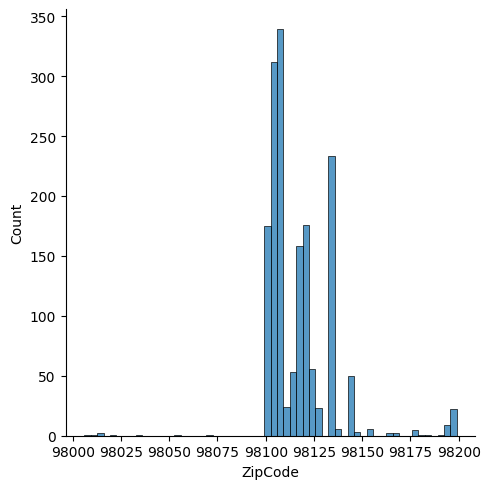

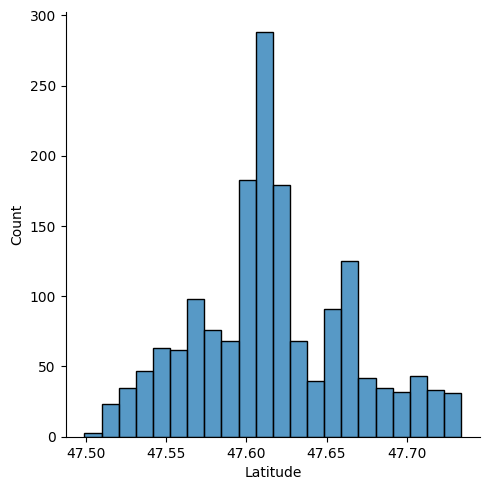

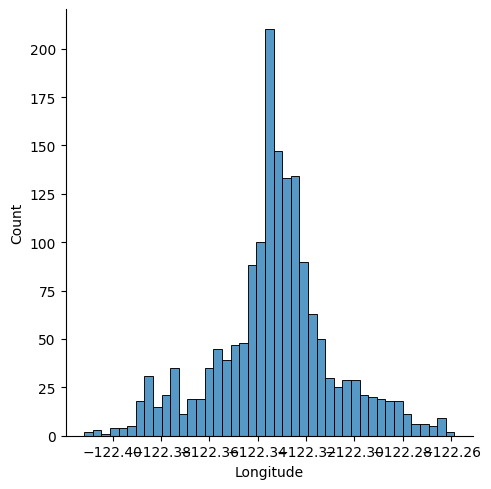

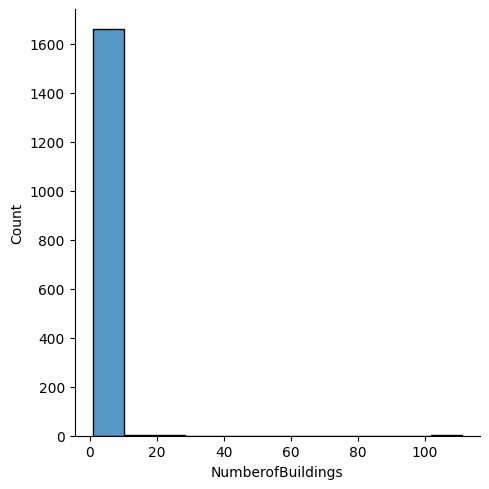

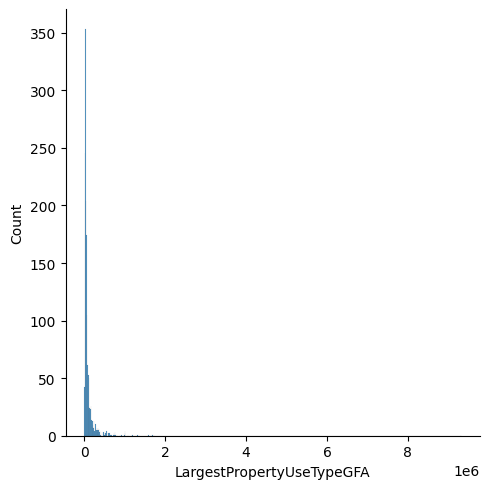

...

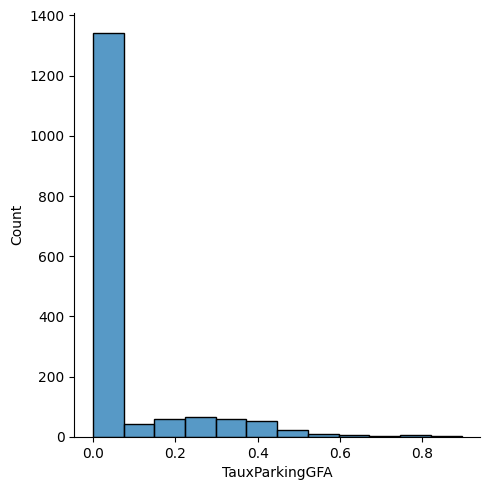

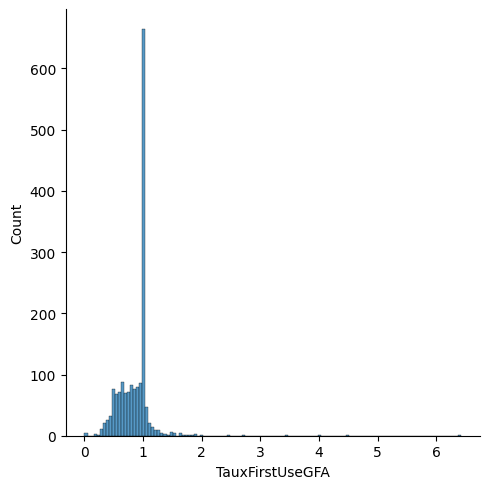

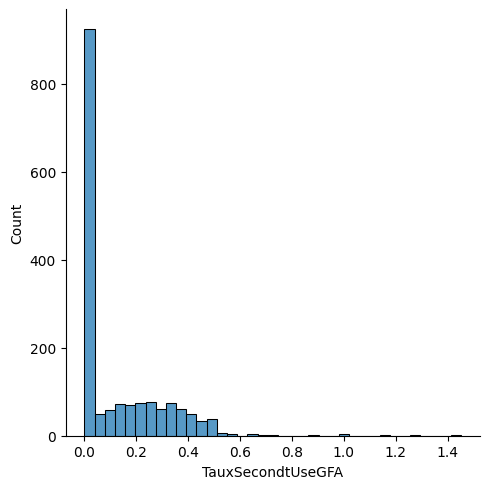

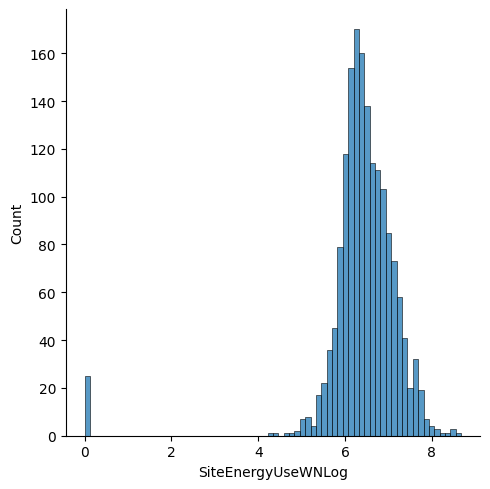

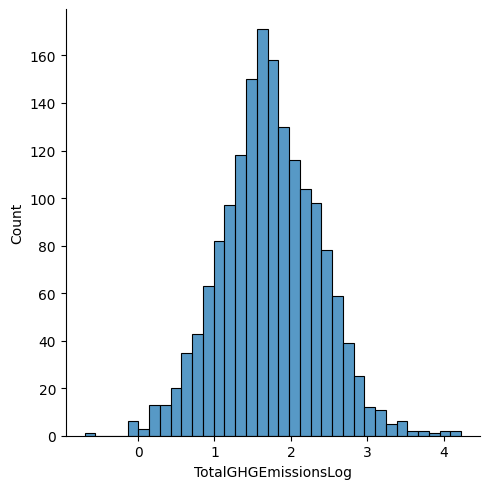

In [92]:
for col in dfBat_Copy.select_dtypes('float64'):
    sns.displot(data=dfBat_Copy[col])
    fic = 'p3_01_06_'+col+'.jpg'
    plt.savefig(fic)

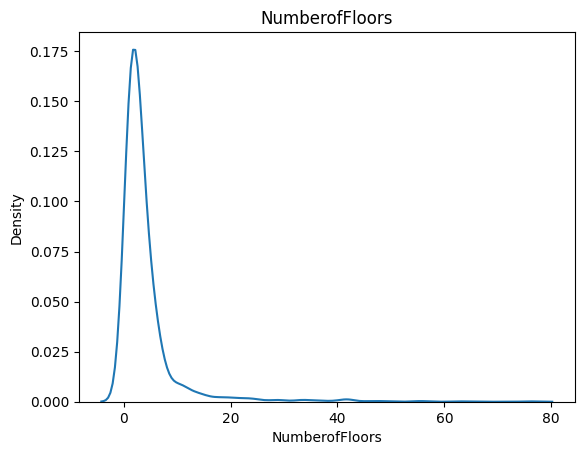

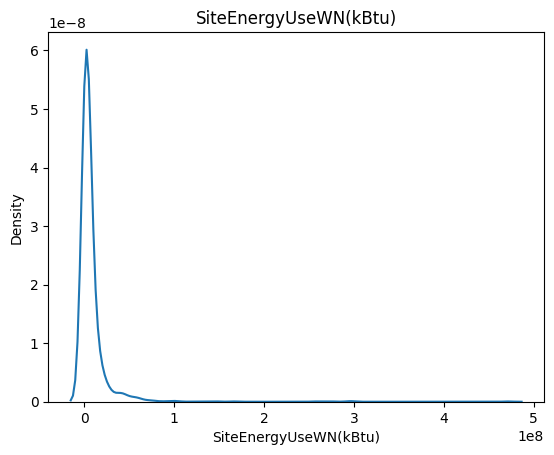

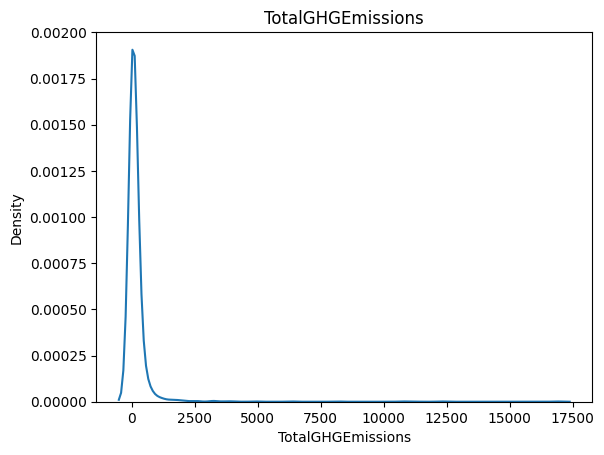

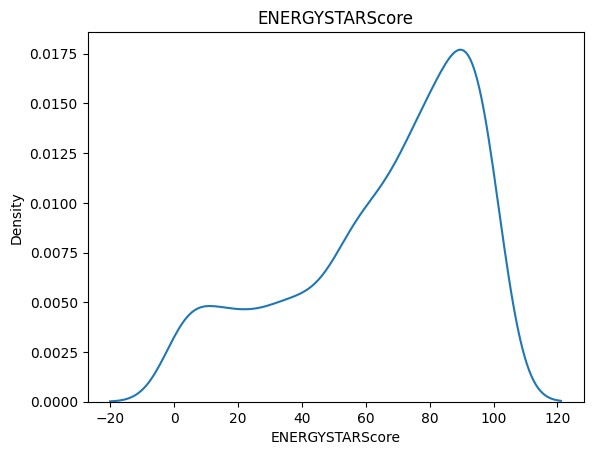

In [93]:
cols = ['NumberofFloors', 'SiteEnergyUseWN(kBtu)','TotalGHGEmissions', 'ENERGYSTARScore']

for col in cols:
    plt.title(col)
    sns.kdeplot(data=dfBat_Copy[col])
    fic = 'p4_01_06_'+col+'.jpg'
    plt.savefig(fic)
    plt.show()

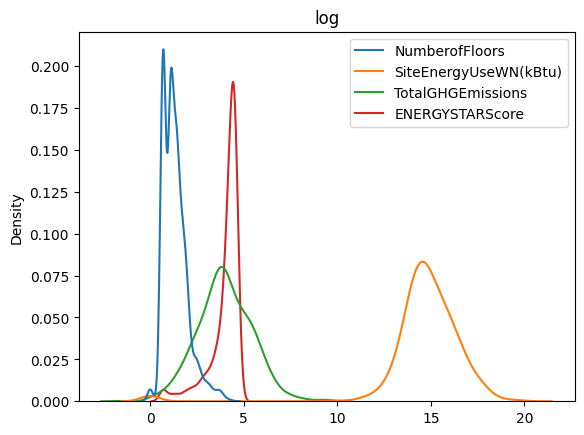

In [94]:

plt.title('log')
sns.kdeplot(data=np.log1p(dfBat_Copy[cols]))
fic = 'p4_01_07_log_'+col+'.jpg'
plt.savefig(fic)
plt.show()

**Variables qualitatives**

In [58]:
cols_cat = dfBat_Copy.select_dtypes(exclude=[np.number]).columns.to_list()

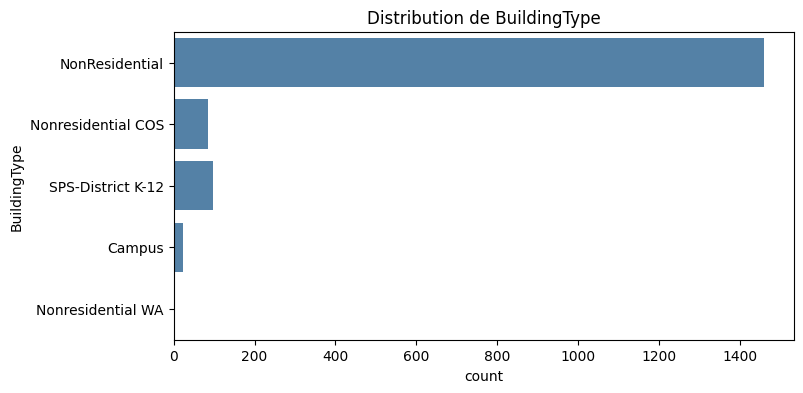

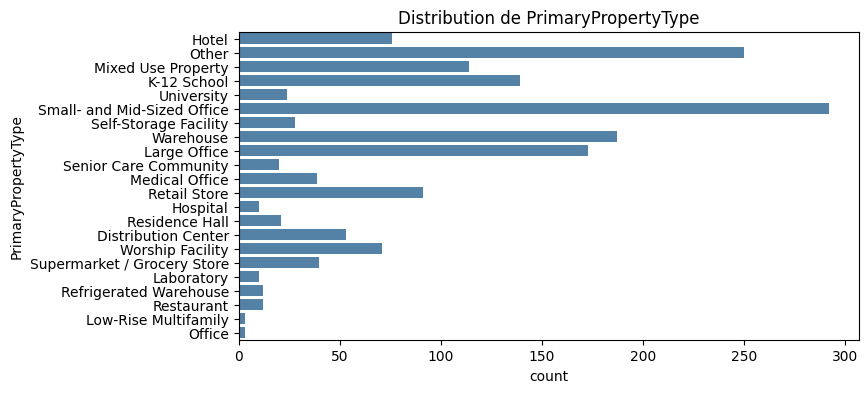

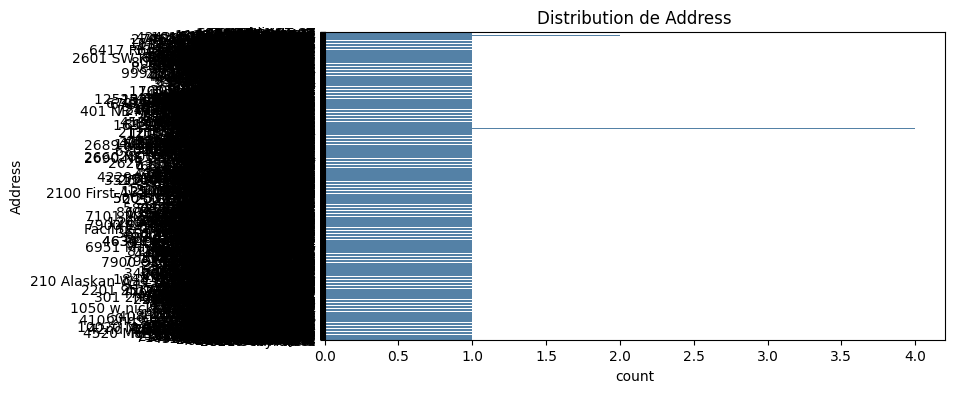

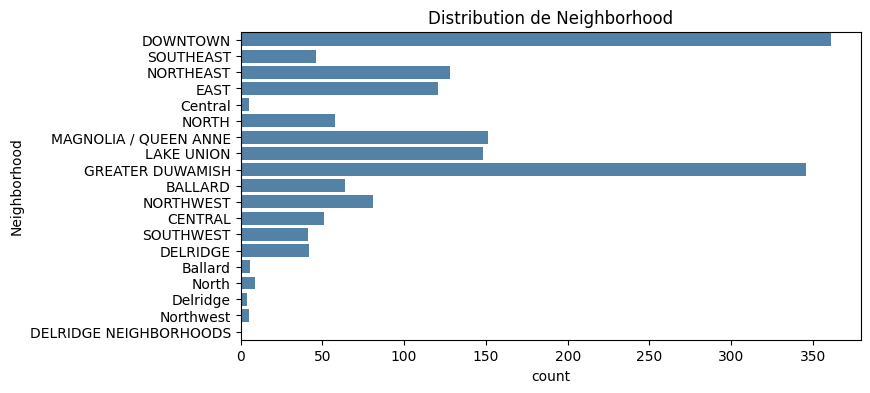

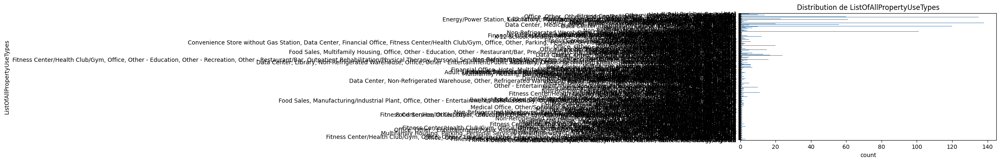

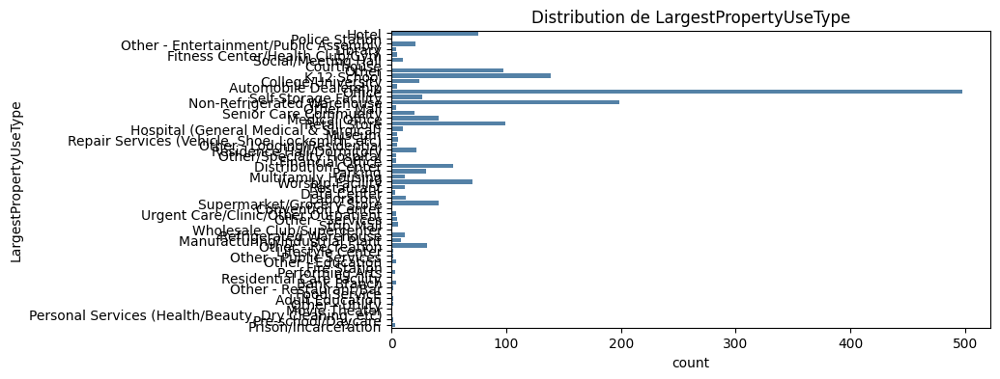

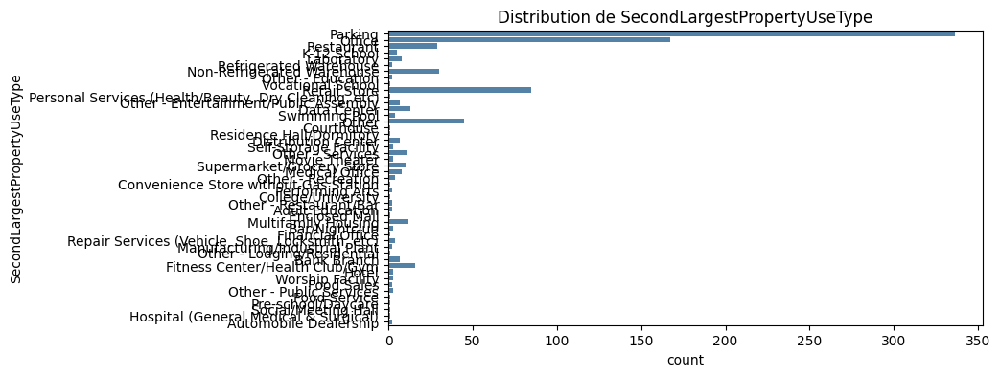

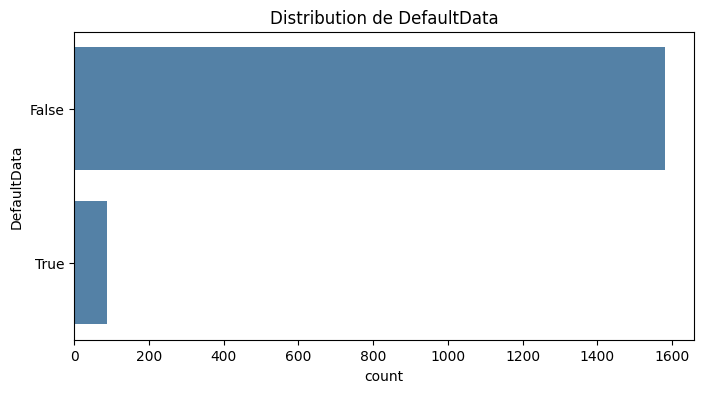

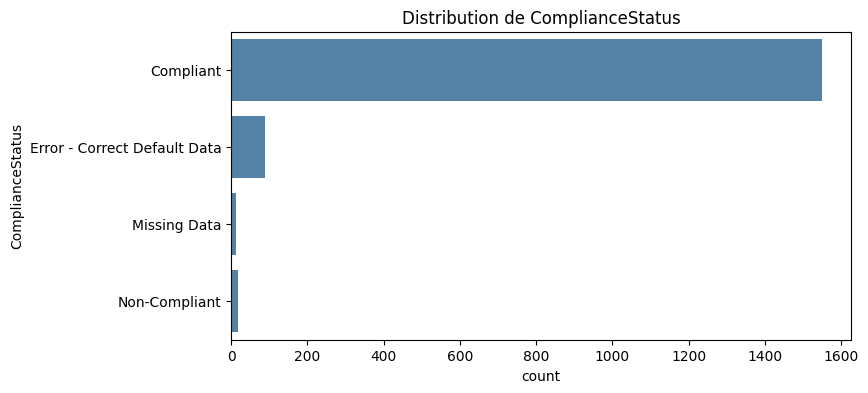

In [95]:
for col in cols_cat:
    plt.figure(figsize=(8, 4))
    sns.countplot(y=col, data=dfBat, color='SteelBlue')
    plt.title('Distribution de ' + col)
    fic = 'distri'+col+'.jpg'
    plt.savefig(fic)
    plt.show()

### <span style='colour:#20185e'>5.2 Analyse des energies</span>

In [60]:
colonne_energie = ['SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)']
dfBat_Copy[colonne_energie].head()


,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu)
0,2003882.00,3946027.0,1276453.0
1,0.00,3242851.0,5145082.0
2,21566554.00,49526664.0,1493800.0
3,2214446.25,2768924.0,1811213.0
4,0.00,5368607.0,8803998.0


consommation vapeur :853945893.26978 soit 6.0768602530921925 %
consommation elec   :9730387911.088 soit 69.2435059528753 %
consommation gaz    :3282011132.0378 soit 23.355487924556094 %


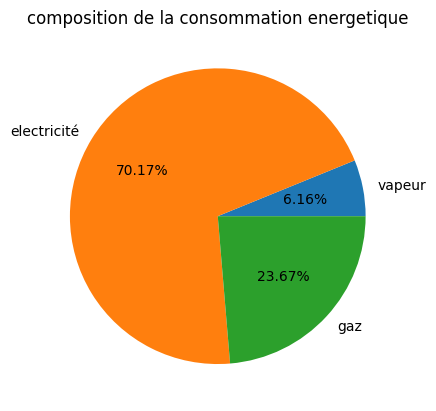

In [96]:
sum_steam = dfBat_Copy['SteamUse(kBtu)'].sum()
sum_elec  = dfBat_Copy['Electricity(kBtu)'].sum()
sum_gas   = dfBat_Copy['NaturalGas(kBtu)'].sum()
sum_total = dfBat_Copy['SiteEnergyUse(kBtu)'].sum()

print(f'consommation vapeur :{sum_steam} soit {sum_steam/sum_total*100} %')
print(f'consommation elec   :{sum_elec} soit {sum_elec/sum_total*100} %')
print(f'consommation gaz    :{sum_gas} soit {sum_gas/sum_total*100} %')


plt.title('composition de la consommation energetique')
plt.pie([sum_steam,sum_elec,sum_gas], labels = ['vapeur','electricité','gaz'], \
        autopct = lambda x: str(round(x, 2)) + '%')
plt.savefig('P4_01_10_enegyuse.jpg')
plt.show()

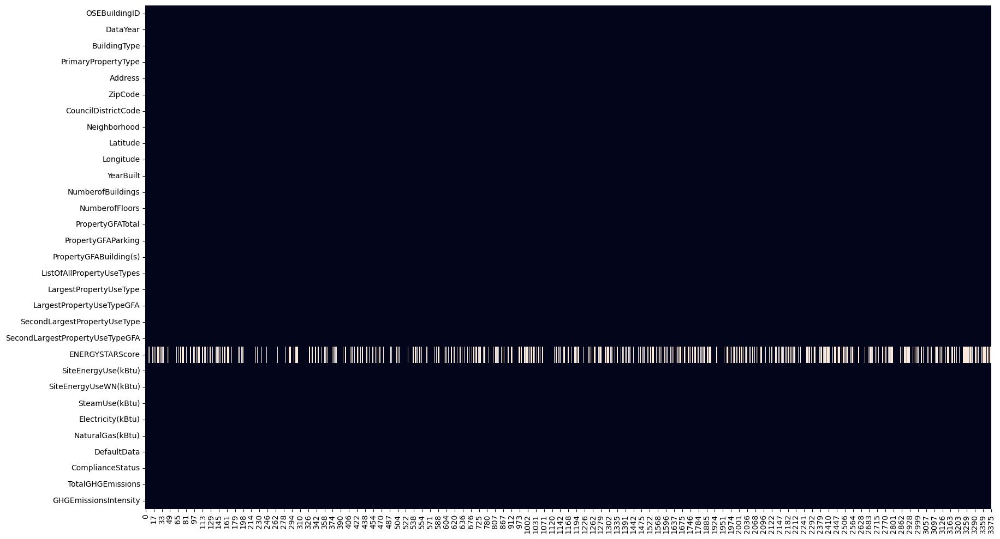

In [62]:
plt.figure(figsize=(20,12))
sns.heatmap(dfBat_Copy.isna().T, cbar= False)
plt.show()

## <span style='background:#33B5FF'>6. Feature engineering </span>

In [63]:
dfBat_Copy.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'Address', 'ZipCode', 'CouncilDistrictCode', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'DefaultData',
       'ComplianceStatus', 'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

**ListOfAllPropertyUseTypes**

In [64]:
# On compte le nombre
dfBat_Copy['Nb_utilisation'] = [len(str(row).split(','))
                            for row in dfBat_Copy['ListOfAllPropertyUseTypes']]

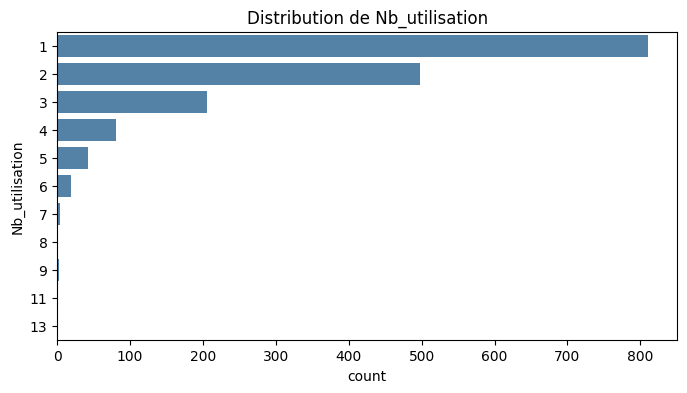

In [97]:

plt.figure(figsize=(8, 4))
sns.countplot(y='Nb_utilisation', data=dfBat_Copy, color='SteelBlue')
plt.title('Distribution de ' + 'Nb_utilisation')
plt.savefig('Distribution de ' + 'Nb_utilisation')
plt.show()

La plupart des bâtiments ont trois utilisations de propriété ou moins, et le maximum est de 13. Comme il pourrait s'agir d'une information ayant une certaine influence sur la consommation totale d'énergie, on ajoute cette variable au jeu de données.

Suppression de la variable 'ListOfAllPropertyUseTypes' désormais inutile

In [66]:
# Suppression de la variable ListOfAllPropertyUseTypes inutile
dfBat_Copy.drop(columns = ['ListOfAllPropertyUseTypes'], inplace=True)


**Variables 'PropertyGFATotal', 'PropertyGFAParking','PropertyGFABuilding(s)'**

Les 3 variables sont fortement liées par colinéarité, on conserve la variable 'PropertyGFABuilding(s)' et on constitue une nouvelle variable avec le pourcentage de la surface du parking sur la surface totale.

In [67]:
# Ajout d'une nouvelle variable 'TauxParkingGFA'
dfBat_Copy['TauxParkingGFA'] = dfBat_Copy['PropertyGFAParking'] / dfBat_Copy['PropertyGFATotal']

**Variables 'LargestPropertyUseTypeGFA' et 'SecondLargestPropertyUseTypeGFA'**

Toutes ces variables sont fortement liées par colinéarité, on ajoute de nouvelles variables du pourcentage de la surface de l'utilisation principale et secondaire en fonction de la surface totale pour conserver l'information mais diminuer la colinéarité.

In [68]:
# Ajout de 2 nouvelles variables 'TauxFirstUseGFA' et 'TauxSecondtUseGFA'
dfBat_Copy['TauxFirstUseGFA'] = dfBat_Copy['LargestPropertyUseTypeGFA'] / dfBat_Copy['PropertyGFATotal']
dfBat_Copy['TauxSecondtUseGFA'] = dfBat_Copy['SecondLargestPropertyUseTypeGFA'] / dfBat_Copy['PropertyGFATotal']

Variables **'DayaYear'** et **'YearBuilt'**

In [69]:
# Ajout d'une nouvelle variable 'BuildingAge'
dfBat_Copy['BuildingAge'] = dfBat_Copy['DataYear'].astype(int)-dfBat_Copy['YearBuilt']

### <span style='colour:#20185e'>6.1 Variable cible 'SiteEnergyUseWN(kBtu)'</span>

**rendons cette distribution plus normale en la transformant en logarithme.**

In [101]:
# Test de transformation de la variable cicle en log1p, log2+1 et log10 +1
test1p = np.log1p(dfBat['SiteEnergyUseWN(kBtu)'])
test2p = np.log2(1 + dfBat['SiteEnergyUseWN(kBtu)'])
test10p = np.log10(1 + dfBat['SiteEnergyUseWN(kBtu)'])

In [102]:
# Constitution du dataframe de travail
df_tmp_test = pd.DataFrame(
    {'test1p': test1p, 'test2p': test2p, 'test10p': test10p})
df_tmp_test

,test1p,test2p,test10p
0,15.824652,22.830147,6.872559
1,15.974742,23.046682,6.937743
2,18.118725,26.139795,7.868862
3,15.753792,22.727917,6.841785
4,16.500395,23.805038,7.166030
5,16.347755,23.584825,7.099740
6,15.617677,22.531545,6.782671
7,15.771071,22.752847,6.849289
8,16.468334,23.758783,7.152106
10,16.627736,23.988753,7.221334


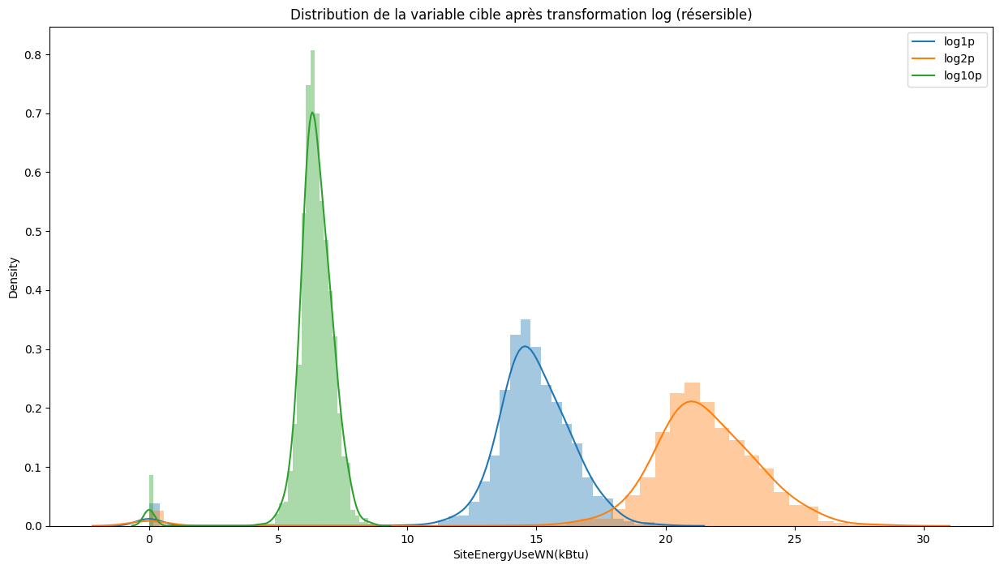

In [103]:
# Visualisation des 3 essais de transformation logarithmique
plt.figure(figsize=(15, 8))
plt.title('Distribution de la variable cible après transformation log (résersible)')
sns.distplot(test1p)
sns.distplot(test2p)
sns.distplot(test10p)
ax = plt.gca()
ax.legend(['log1p', 'log2p', 'log10p'])
plt.savefig('Distribution de log1p log2p log10p')
plt.show()

In [73]:
df_tmp_test.describe().T

,count,mean,std,min,25%,50%,75%,max
test1p,1665.0,14.735295,2.231438,0.0,14.073725,14.803246,15.776973,19.971671
test2p,1665.0,21.258537,3.219285,0.0,20.304093,21.356570,22.761360,28.813031
test10p,1665.0,6.399457,0.969101,0.0,6.112141,6.428968,6.851852,8.673587


**Moins de variance et une amplitude plus faible pour log10 +1, notre choix se portera sur une transformation de la variable en logarithme base 10 +1 (évite l'infini pour 0).**

In [74]:
# Ajout d'une nouvelle variable 'SiteEnergyUseWNLog'
dfBat_Copy['SiteEnergyUseWNLog'] = np.log10(1+dfBat_Copy['SiteEnergyUseWN(kBtu)'])

### <span style='colour:#20185e'>6.2 Variable cible Variable cible 'TotalGHGEmissions'</span> 

rendons cette distribution plus normale en la transformant en logarithme.

In [75]:
# Test de transformation de la variable cicle en log1p, log2+1 et log10 +1
test1p = np.log1p(dfBat['TotalGHGEmissions'])
test2p = np.log2(1+dfBat['TotalGHGEmissions'])
test10p = np.log10(1+dfBat['TotalGHGEmissions'])

In [76]:
# Constitution du dataframe de travail
df_tmp_test = pd.DataFrame(
    {'test1p': test1p, 'test2p': test2p, 'test10p': test10p})
df_tmp_test

,test1p,test2p,test10p
0,5.525373,7.971429,2.399639
1,5.693261,8.213639,2.472552
2,7.645053,11.029480,3.320204
3,5.660979,8.167067,2.458532
4,6.226556,8.983022,2.704159
5,5.713106,8.242269,2.481170
6,5.176940,7.468746,2.248317
7,5.404972,7.797726,2.347350
8,5.974217,8.618973,2.594569
10,6.539962,9.435170,2.840269


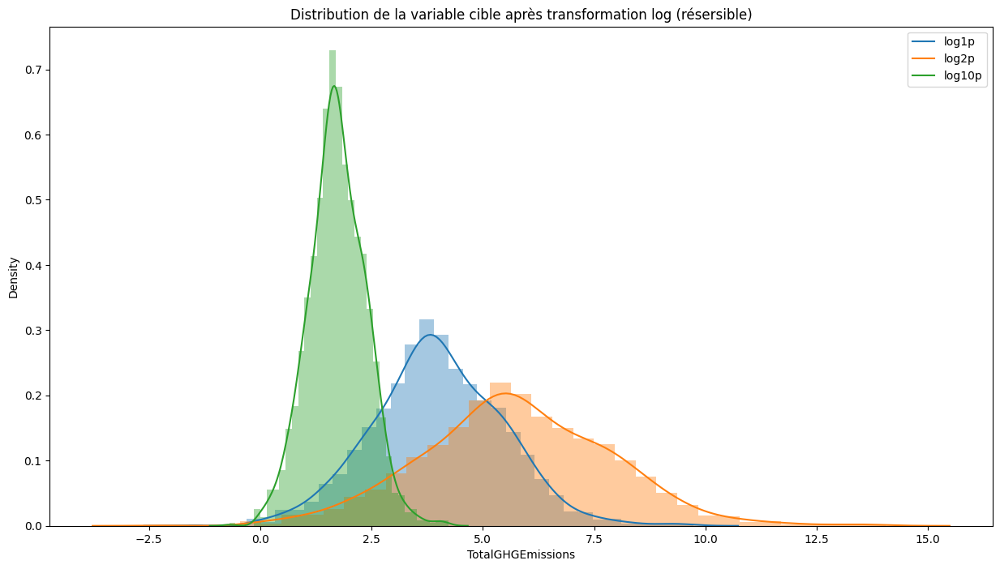

In [99]:
# Visualisation des 3 essais de transformation logarithmique
plt.figure(figsize=(15, 8))
plt.title('Distribution de la variable cible après transformation log (résersible)')
sns.distplot(test1p)
sns.distplot(test2p)
sns.distplot(test10p)
ax = plt.gca()
ax.legend(['log1p', 'log2p', 'log10p'])

plt.show()


In [78]:
df_tmp_test.describe().T

,count,mean,std,min,25%,50%,75%,max
test1p,1666.0,3.983873,1.472486,-1.609438,3.042969,3.923556,4.965516,9.733410
test2p,1666.0,5.747513,2.124348,-2.321928,4.390076,5.660495,7.163725,14.042342
test10p,1666.0,1.730174,0.639493,-0.698970,1.321545,1.703979,2.156496,4.227166


Moins de variance et une amplitude plus faible pour log10 +1, notre choix se portera sur une transformation de la variable en logarithme base 10 +1 (évite l'infini pour 0).

In [79]:
# Ajout d'une nouvelle variable 'TotalGHGEmissionsLog'
dfBat_Copy['TotalGHGEmissionsLog'] = np.log10(1+dfBat_Copy['TotalGHGEmissions'])

In [80]:
# Colonnes numériques en supprimant les variables fortement liées
cols_num_new = dfBat_Copy.select_dtypes(include=[np.number]).columns.to_list()


**Matrice de Corrélation**

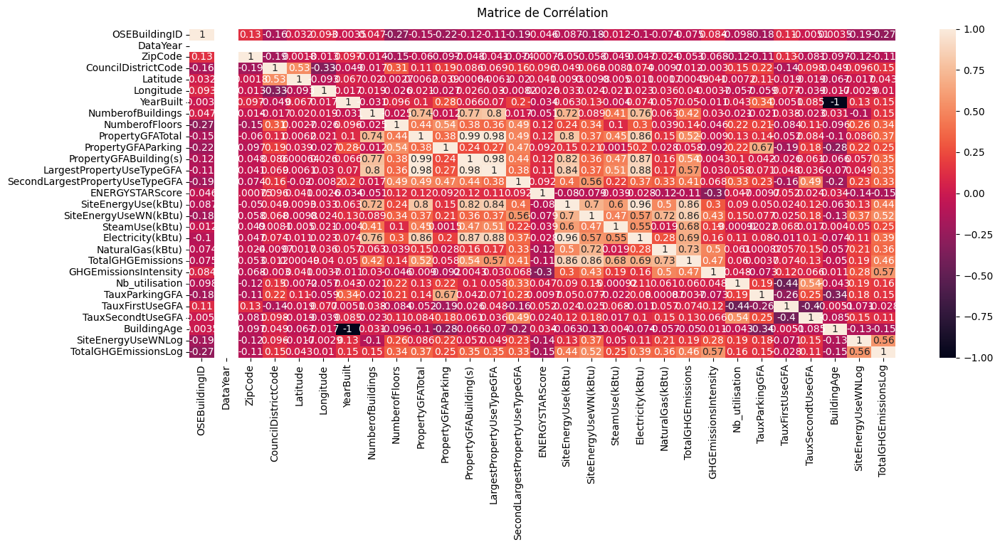

In [81]:
# Analyse  des variables quantitatives
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(dfBat_Copy[cols_num_new].corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Matrice de Corrélation', fontdict={'fontsize':12}, pad=12);


In [82]:
pd.DataFrame(dfBat_Copy[cols_num_new].corr()['SiteEnergyUse(kBtu)']).sort_values(
    by='SiteEnergyUse(kBtu)', ascending=False)

,SiteEnergyUse(kBtu)
SiteEnergyUse(kBtu),1.000000
Electricity(kBtu),0.956264
TotalGHGEmissions,0.859940
LargestPropertyUseTypeGFA,0.841984
PropertyGFABuilding(s),0.819631
PropertyGFATotal,0.804168
NumberofBuildings,0.715038
SiteEnergyUseWN(kBtu),0.704050
SteamUse(kBtu),0.604999
NaturalGas(kBtu),0.503368


**Remarque** : 
Pour les 4 targets possibles :

- Emissions de GES : TotalGHGEmissions / GHGEmissionsIntensity
- Consommation d'énergie : SiteEnergyUse(kBtu) / SiteEnergyUseWN(kBtu)

nous conservons les 2 variables les plus corrélées :

- TotalGHGEmissions
- SiteEnergyUseWN(kBtu).

In [86]:
df = dfBat_Copy.copy()
dfBat_Copy.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'Address', 'ZipCode', 'CouncilDistrictCode', 'Neighborhood', 'Latitude',
       'Longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)',
       'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)',
       'DefaultData', 'ComplianceStatus', 'TotalGHGEmissions',
       'GHGEmissionsIntensity', 'Nb_utilisation', 'TauxParkingGFA',
       'TauxFirstUseGFA', 'TauxSecondtUseGFA', 'BuildingAge',
       'SiteEnergyUseWNLog', 'TotalGHGEmissionsLog'],
      dtype='object')

In [87]:
var_cibles = ['SiteEnergyUseWN(kBtu)', 'SiteEnergyUseWNLog',
              'TotalGHGEmissions', 'TotalGHGEmissionsLog', 'ENERGYSTARScore']

In [88]:
var_inputs = ['BuildingType', 'CouncilDistrictCode', 'Neighborhood',
              'NumberofBuildings', 'NumberofFloors', 'PropertyGFABuilding(s)',
              'PrimaryPropertyType', 'LargestPropertyUseType',
              'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)',
              'Latitude', 'Longitude','Nb_utilisation','BuildingAge',
              'TauxFirstUseGFA','TauxSecondtUseGFA','TauxParkingGFA']

In [89]:
#Dataframe de travail 
df = df[var_cibles+var_inputs]
df.head()

,SiteEnergyUseWN(kBtu),SiteEnergyUseWNLog,TotalGHGEmissions,TotalGHGEmissionsLog,ENERGYSTARScore,BuildingType,CouncilDistrictCode,Neighborhood,NumberofBuildings,NumberofFloors,PropertyGFABuilding(s),PrimaryPropertyType,LargestPropertyUseType,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Latitude,Longitude,Nb_utilisation,BuildingAge,TauxFirstUseGFA,TauxSecondtUseGFA,TauxParkingGFA
0,7456910.0,6.872559,249.98,2.399639,60.0,NonResidential,7,DOWNTOWN,1.0,12,88434,Hotel,Hotel,2003882.00,3946027.0,1276453.0,47.61220,-122.33799,1,89,1.000000,0.000000,0.000000
1,8664479.0,6.937743,295.86,2.472552,61.0,NonResidential,7,DOWNTOWN,1.0,11,88502,Hotel,Hotel,0.00,3242851.0,5145082.0,47.61317,-122.33393,3,20,0.809918,0.145453,0.145453
2,73937112.0,7.868862,2089.28,3.320204,43.0,NonResidential,7,DOWNTOWN,1.0,41,759392,Hotel,Hotel,21566554.00,49526664.0,1493800.0,47.61393,-122.33810,1,47,0.791220,0.000000,0.205748
3,6946800.5,6.841785,286.43,2.458532,56.0,NonResidential,7,DOWNTOWN,1.0,10,61320,Hotel,Hotel,2214446.25,2768924.0,1811213.0,47.61412,-122.33664,1,90,1.000000,0.000000,0.000000
4,14656503.0,7.166030,505.01,2.704159,75.0,NonResidential,7,DOWNTOWN,1.0,18,113580,Hotel,Hotel,0.00,5368607.0,8803998.0,47.61375,-122.34047,3,36,0.703070,0.387339,0.353115


In [90]:
df.shape

(1665, 23)

In [91]:
df.to_csv('dfBat_nettoye.csv')